In [1]:
import os
import cv2
import time
import numpy as np
import pandas as pd
from pandas import DataFrame
import matplotlib.pyplot as plt
import shutil 
from sklearn.model_selection import train_test_split
from itertools import combinations

C:\Users\Bolbol\anaconda3\lib\site-packages\numpy\_distributor_init.py:30: UserWarning: loaded more than 1 DLL from .libs:
C:\Users\Bolbol\anaconda3\lib\site-packages\numpy\.libs\libopenblas.PYQHXLVVQ7VESDPUVUADXEVJOBGHJPAY.gfortran-win_amd64.dll
C:\Users\Bolbol\anaconda3\lib\site-packages\numpy\.libs\libopenblas.WCDJNK7YVMPZQ2ME2ZZHJJRJ3JIKNDB7.gfortran-win_amd64.dll
  warnings.warn("loaded more than 1 DLL from .libs:"


#### Face Recognition Dataset, a database of face photographs designed for the creation of face detection and recognition models. This dataset has been derived from the Labeled Faces in the Wild Dataset.
#### This dataset is a collection of JPEG pictures of famous people collected on the internet.
#### The Dataset : Each picture is centered on a single face, and every image is encoded in RGB. The original images are of the size 250 x 250. The dataset contains 1680 directories, each representing a celebrity. Each directory has 2-50 images for the celebrity.
#### Extracted Faces: Faces extracted from the original image using Haar-Cascade Classifier (cv2) encoded in RGB and size of image is 128, 128

### Iterate through files in a subdir

In [2]:
directory = r'C:\Users\Bolbol\Desktop\stage\lfw\Face Data\Face Dataset\0'
for filename in os.listdir(directory):
    if filename.endswith(".jpg") or filename.endswith(".png"):
        print(os.path.join(directory, filename))
    else:
        continue

C:\Users\Bolbol\Desktop\stage\lfw\Face Data\Face Dataset\0\0.jpg
C:\Users\Bolbol\Desktop\stage\lfw\Face Data\Face Dataset\0\1.jpg
C:\Users\Bolbol\Desktop\stage\lfw\Face Data\Face Dataset\0\2.jpg
C:\Users\Bolbol\Desktop\stage\lfw\Face Data\Face Dataset\0\3.jpg


### Iterate through files and subdirs in a dir

In [6]:
photos_person=0
persons=0
name=[]
photo=[]
flw = r'C:\Users\Bolbol\Desktop\stage\lfw\Face Data\Face Dataset'
for directory in os.listdir(flw):
    path=os.path.join(flw, directory)
    persons = persons +1
    #print(path)
    for filename in os.listdir(path):
        #print(os.path.join(path, filename))
        if filename.endswith(".jpg") or filename.endswith(".png"):
            #print(os.path.join(path, filename))
            photos_person = photos_person+1
            
        else:
            continue
    #print(directory,photos_person)
    name.append(directory)
    photo.append(photos_person)
    photos_person =0
    dict = {'id': name, 'photo': photo} 
    df = pd.DataFrame(dict)
df

,id,photo
0,0,4
1,1,2
2,10,4
3,100,2
4,1000,2
...,...,...
1675,995,2
1676,996,2
1677,997,3
1678,998,2


In [7]:
df.dtypes

id       object
photo     int64
dtype: object

In [8]:
dups = df.pivot_table(index=['photo'], aggfunc='size') #the number of persons with n photos 
dups

photo
2     779
3     291
4     187
5     112
6      55
7      39
8      33
9      26
10     15
11     16
12     10
13     11
14     10
15     11
16      3
17      8
18      5
19      7
20      5
21      4
22      5
23      3
24      3
25      1
26      2
27      1
28      2
29      2
30      2
31      2
32      3
33      3
35      1
36      1
37      1
39      2
41      2
42      2
44      1
48      1
49      1
50     12
dtype: int64

In [9]:
n=0
p=0
for i in photo:
    if i>10 :
        n=n+i
        p=p+1
print('quantite de personnes: ',p,' ayant plus de 10 photos, totale des photos: ',n)

quantite de personnes:  143  ayant plus de 10 photos, totale des photos:  3214


#### on remarque qu'il y a 143  personnes qui ont plus de 10 photos allant jusqu'a 530 photos ce qui emmenra au overfitting des modeles d'ou on decide de les eliminer

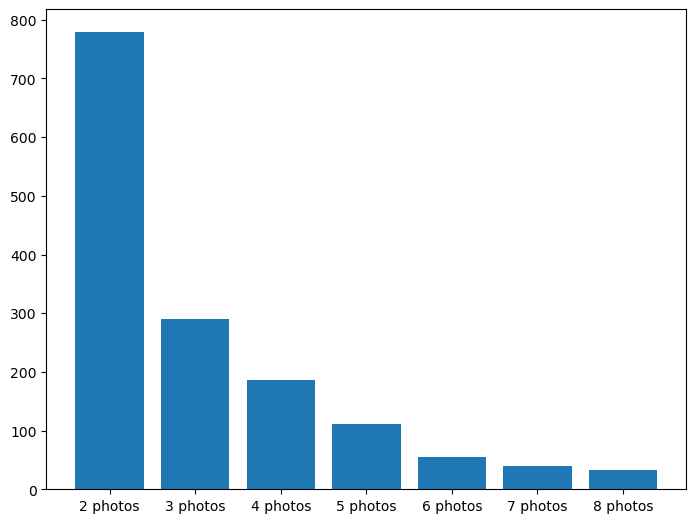

In [10]:
fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
nb=[dups[2],dups[3],dups[4],dups[5],dups[6],dups[7],dups[8]]
photos = ['2 photos','3 photos','4 photos','5 photos','6 photos','7 photos','8 photos']
ax.bar(photos,nb)
plt.show()

#### on decide de prendre les personnes ayant entre 3 et 5 photos

In [11]:
df_filtered = df[(df['photo'] < 6 )&( df['photo'] > 1)]
df_filtered

,id,photo
0,0,4
1,1,2
2,10,4
3,100,2
4,1000,2
...,...,...
1675,995,2
1676,996,2
1677,997,3
1678,998,2


In [12]:
lstname=df_filtered['id'].tolist()

#### Resultat 1369 personnes avec 2 a 5 photos

In [13]:
flw = r'C:\Users\Bolbol\Desktop\stage\lfw\Face Data\Face Dataset'
flw_trim = r'C:\Users\Bolbol\Desktop\stage\lfw\Face Dataset Trim'
for directory in os.listdir(flw):
    path_src=os.path.join(flw, directory)
    if directory in lstname:
        path_dest=os.path.join(flw_trim, directory)
        #print(path_dest)
        destination = shutil.copytree(path_src, path_dest) 
    else:
          continue

FileExistsError: [WinError 183] Cannot create a file when that file already exists: 'C:\\Users\\Bolbol\\Desktop\\stage\\lfw\\Face Dataset Trim\\0'

### Statistiques sur les listes de comparaisons:

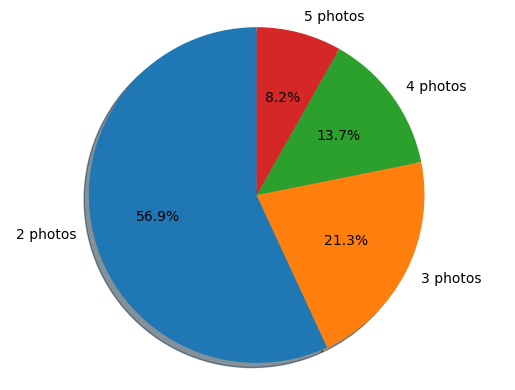

In [14]:
# Pie chart, where the slices will be ordered and plotted counter-clockwise:
labels = '2 photos', '3 photos', '4 photos', '5 photos'
sizes = [dups[2],dups[3],dups[4],dups[5]]
#explode = (0, 0.1, 0, 0)  # only "explode" the 2nd slice (i.e. 'Hogs')

fig1, ax1 = plt.subplots()
ax1.pie(sizes, labels=labels, autopct='%1.1f%%',shadow=True, startangle=90)
ax1.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.show()

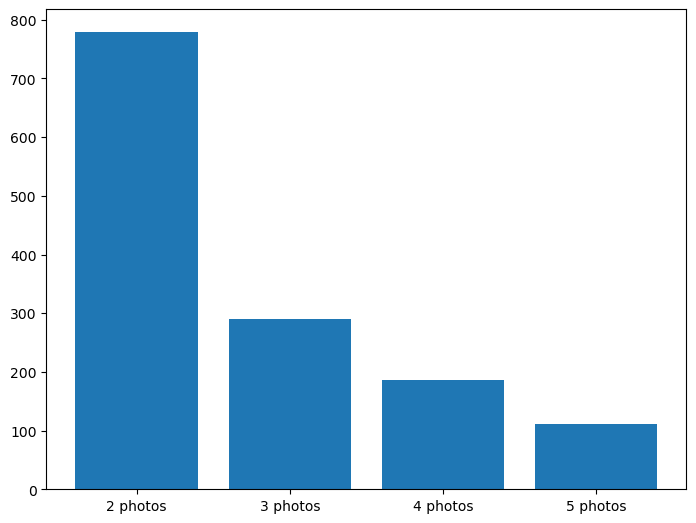

In [15]:
fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
nb=[dups[2],dups[3],dups[4],dups[5]]
photo = ['2 photos','3 photos','4 photos','5 photos']
ax.bar(photo,nb)
plt.show()

#### categorie 2 photos : 779 personnes  
#### categorie 3 photos : 291 personnes
#### categorie 4 photos : 187 personnes
#### categorie 5 photos : 112 personnes


#### on organise le datatset sour forme de 70% de donnees de chaque categorie en trainset et 30% de chaque categorie en testset 

In [23]:
from sklearn.model_selection import train_test_split

training_data, testing_data = train_test_split(df_filtered, test_size=0.3, random_state=25) 

print(f"No. of training examples: {training_data.shape[0]}")
print(f"No. of testing examples: {testing_data.shape[0]}")


No. of training examples: 958
No. of testing examples: 411


In [24]:
train_name=training_data['id'].tolist()
test_name=testing_data['id'].tolist()

In [33]:
flw = r'C:\Users\Bolbol\Desktop\stage\lfw\Face Data\Face Dataset'
flw_trim = r'C:\Users\Bolbol\Desktop\stage\lfw\Face Dataset Trim'
flw_train = r'C:\Users\Bolbol\Desktop\stage\lfw\Face Dataset Train'
flw_test = r'C:\Users\Bolbol\Desktop\stage\lfw\Face Dataset Test'

In [21]:
for directory in os.listdir(flw_trim):
    path_src=os.path.join(flw_trim, directory)
    if directory in train_name:
        path_dest=os.path.join(flw_train, directory)
        #print(path_dest)
        destination = shutil.copytree(path_src, path_dest)   
    else:
        path_dest=os.path.join(flw_test, directory)
        #print(path_dest)
        destination = shutil.copytree(path_src, path_dest) 

In [26]:
def text_file(intraclasse_train,interclasse_train,intraclasse_test,interclasse_test):
    str1 = ''.join(str(e) for e in intraclasse_train)
    str2 = ''.join(str(e) for e in interclasse_train)
    str3 = ''.join(str(e) for e in intraclasse_test)
    str4 = ''.join(str(e) for e in interclasse_test)
    intra_train = open("intraclasse_train.txt","w")
    intra_train.write(str1)
    intra_train.close()
    inter_train = open("interclasse_train.txt","w")
    inter_train.write(str2)
    inter_train.close()
    intra_test = open("intraclasse_test.txt","w")
    intra_test.write(str3)
    intra_test.close()
    inter_test = open("interclasse_test.txt","w")
    inter_test.write(str4)
    inter_test.close()

In [27]:
def create_pairs_inter(ROOT):
    num_folders = len(os.listdir(ROOT))
    dissimilar_data_id1 = []
    dissimilar_data_id2 = []
    dissimilar_data_img1 = []
    dissimilar_data_img2 = []
    ids=[]
    for i in os.listdir(ROOT):
        ids.append(int(i))
    #print(ids)
    for i in os.listdir(ROOT):
        files=os.listdir(os.path.join(ROOT, i))
        #print(i)
        
        # Creating pairs of different faces 0
        for j in range(int(i), min(int(i)+80, num_folders)):
            #print(j)
            if j in ids:
                #print(j)
                #dissimilar_data.append(((str(i), "0.jpg"), (str(j), "0.jpg"), 0))
                dissimilar_data_id1.append(i)
                dissimilar_data_img1.append("0.jpg")
                dissimilar_data_id2.append(str(j))
                dissimilar_data_img2.append("0.jpg")
        dicti2 = {'id1': dissimilar_data_id1, 'img1': dissimilar_data_img1, 'id2': dissimilar_data_id2, 'img2': dissimilar_data_img2} 
        dfdsim = pd.DataFrame(dicti2)
    return dfdsim


In [28]:
def create_pairs_intra(ROOT):
    num_folders = len(os.listdir(ROOT))
    similar_data_id1 = []
    similar_data_id2 = []
    similar_data_img1 = []
    similar_data_img2 = []
    
    for i in os.listdir(ROOT):
        files=os.listdir(os.path.join(ROOT, i)) 
        
        # Creating pairs of similar faces 1
        for pair in list(combinations(files, 2)):
            #similar_data.append(((str(i), pair[0]), (str(i), pair[1]), 1))
            similar_data_id1.append(str(i))
            similar_data_img1.append(pair[0])
            similar_data_id2.append(str(i))
            similar_data_img2.append(pair[1])
        dicti1 = {'id1': similar_data_id1, 'img1': similar_data_img1, 'id2': similar_data_id2, 'img2': similar_data_img2} 
        dfsim = pd.DataFrame(dicti1)
    
    return dfsim


In [29]:
#flw_train= r'C:\Users\Bolbol\Desktop\stage\lfw\Face Dataset Train'
intra_train=create_pairs_intra(flw_train)
inter_train=create_pairs_inter(flw_train)
intra_test=create_pairs_intra(flw_test)
inter_test=create_pairs_inter(flw_test)

In [30]:
inter_test

,id1,img1,id2,img2
0,105,0.jpg,105,0.jpg
1,105,0.jpg,118,0.jpg
2,105,0.jpg,123,0.jpg
3,105,0.jpg,124,0.jpg
4,105,0.jpg,125,0.jpg
...,...,...,...,...
1887,78,0.jpg,136,0.jpg
1888,78,0.jpg,138,0.jpg
1889,78,0.jpg,144,0.jpg
1890,78,0.jpg,149,0.jpg


#### Ca resulte en toutes les combinaisons possibles pour les comparaisons intra-classes or on doit avoir le meme nombre de comparaisons intra-classes que inter-classe. Ainsi, on extrait aleatoirement des intra_train et intra_test pour avoir le meme nombres de lignes que inter_train et inter_test respecitivement

In [170]:
#inter_train_trim=sample(list1,3)
inter_train_trim=inter_train.sample(len(intra_train))
inter_test_trim=inter_test.sample(len(intra_test))

#### Pour sauvgarder les memes listes de comparaisons et ne pas les generer a chaque execution de code, on a sauvgarder les dataframes en fichier text qu'on fait appelle a pour le reste du travail

In [31]:
#np.savetxt(r'C:/Users/Bolbol/Desktop/stage/lfw/intraclasse_train.txt',intra_train, fmt='%s')
#np.savetxt(r'C:/Users/Bolbol/Desktop/stage/lfw/interclasse_train.txt',inter_train_trim, fmt='%s')
#np.savetxt(r'C:/Users/Bolbol/Desktop/stage/lfw/intraclasse_test.txt',intra_test, fmt='%s')
#np.savetxt(r'C:/Users/Bolbol/Desktop/stage/lfw/interclasse_test.txt',inter_test_trim, fmt='%s')

In [2]:
intra_train = pd.read_csv('C:/Users/Bolbol/Desktop/stage/lfw/intraclasse_train.txt', sep=" ", header=None)
intra_train.columns = ["id1", "img1", "id2", "img2"]
inter_train = pd.read_csv('C:/Users/Bolbol/Desktop/stage/lfw/interclasse_train.txt', sep=" ", header=None)
inter_train.columns = ["id1", "img1", "id2", "img2"]
intra_test = pd.read_csv('C:/Users/Bolbol/Desktop/stage/lfw/intraclasse_test.txt', sep=" ", header=None)
intra_test.columns = ["id1", "img1", "id2", "img2"]
inter_test = pd.read_csv('C:/Users/Bolbol/Desktop/stage/lfw/interclasse_test.txt', sep=" ", header=None)
inter_test.columns = ["id1", "img1", "id2", "img2"]

In [108]:
new_df = intra_train.iloc[:, 0:1]
new_df

,id1
0,0
1,0
2,0
3,0
4,0
...,...
2773,997
2774,998
2775,999
2776,999


In [63]:
gg=intra_train.values.tolist()
gg

[[0, '0.jpg', 0, '1.jpg'],
 [0, '0.jpg', 0, '2.jpg'],
 [0, '0.jpg', 0, '3.jpg'],
 [0, '1.jpg', 0, '2.jpg'],
 [0, '1.jpg', 0, '3.jpg'],
 [0, '2.jpg', 0, '3.jpg'],
 [1, '0.jpg', 1, '1.jpg'],
 [10, '0.jpg', 10, '1.jpg'],
 [10, '0.jpg', 10, '2.jpg'],
 [10, '0.jpg', 10, '3.jpg'],
 [10, '1.jpg', 10, '2.jpg'],
 [10, '1.jpg', 10, '3.jpg'],
 [10, '2.jpg', 10, '3.jpg'],
 [100, '0.jpg', 100, '1.jpg'],
 [1000, '0.jpg', 1000, '1.jpg'],
 [1001, '0.jpg', 1001, '1.jpg'],
 [1001, '0.jpg', 1001, '2.jpg'],
 [1001, '1.jpg', 1001, '2.jpg'],
 [1002, '0.jpg', 1002, '1.jpg'],
 [1002, '0.jpg', 1002, '2.jpg'],
 [1002, '0.jpg', 1002, '3.jpg'],
 [1002, '0.jpg', 1002, '4.jpg'],
 [1002, '1.jpg', 1002, '2.jpg'],
 [1002, '1.jpg', 1002, '3.jpg'],
 [1002, '1.jpg', 1002, '4.jpg'],
 [1002, '2.jpg', 1002, '3.jpg'],
 [1002, '2.jpg', 1002, '4.jpg'],
 [1002, '3.jpg', 1002, '4.jpg'],
 [1004, '0.jpg', 1004, '1.jpg'],
 [1005, '0.jpg', 1005, '1.jpg'],
 [1008, '0.jpg', 1008, '1.jpg'],
 [1008, '0.jpg', 1008, '2.jpg'],
 [1008, '1.j

In [3]:
inter_train

,id1,img1,id2,img2
0,29,0.jpg,58,0.jpg
1,361,0.jpg,365,0.jpg
2,527,0.jpg,554,0.jpg
3,481,0.jpg,514,0.jpg
4,43,0.jpg,94,0.jpg
...,...,...,...,...
2773,745,0.jpg,778,0.jpg
2774,279,0.jpg,310,0.jpg
2775,706,0.jpg,756,0.jpg
2776,463,0.jpg,527,0.jpg


In [4]:
intra_train

,id1,img1,id2,img2
0,0,0.jpg,0,1.jpg
1,0,0.jpg,0,2.jpg
2,0,0.jpg,0,3.jpg
3,0,1.jpg,0,2.jpg
4,0,1.jpg,0,3.jpg
...,...,...,...,...
2773,997,1.jpg,997,2.jpg
2774,998,0.jpg,998,1.jpg
2775,999,0.jpg,999,1.jpg
2776,999,0.jpg,999,2.jpg


In [5]:
inter_test

,id1,img1,id2,img2
0,268,0.jpg,302,0.jpg
1,123,0.jpg,179,0.jpg
2,262,0.jpg,294,0.jpg
3,335,0.jpg,376,0.jpg
4,31,0.jpg,72,0.jpg
...,...,...,...,...
1111,31,0.jpg,59,0.jpg
1112,23,0.jpg,31,0.jpg
1113,384,0.jpg,392,0.jpg
1114,267,0.jpg,300,0.jpg


In [6]:
intra_test

,id1,img1,id2,img2
0,1003,0.jpg,1003,1.jpg
1,1003,0.jpg,1003,2.jpg
2,1003,1.jpg,1003,2.jpg
3,1012,0.jpg,1012,1.jpg
4,1013,0.jpg,1013,1.jpg
...,...,...,...,...
1111,987,1.jpg,987,4.jpg
1112,987,2.jpg,987,3.jpg
1113,987,2.jpg,987,4.jpg
1114,987,3.jpg,987,4.jpg


# Détection facial

## On essaie plusieurs methodes de detection faciale : CNN et dlib, OpenCV et MTCNN dans la partie du modelisation avec facenet

### Detection faciale avec CNN et dlib :

66 82 100 99
78 93 83 83
78 85 83 82
86 85 83 82


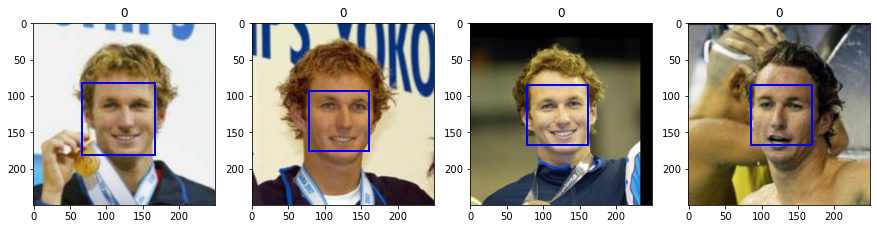

In [124]:
import matplotlib.patches as patches
import matplotlib.pyplot as plt
import dlib
from pathlib import Path
from skimage import io

%matplotlib inline

# Load trained model
cnn_face_detector = dlib.cnn_face_detection_model_v1(r'C:\Users\Bolbol\Desktop\stage\lfw\mmod_human_face_detector.dat\mmod_human_face_detector.dat')

# Function to detect and show faces in images
def detect_face_dlib(img_path, ax):
    # Read image and run algorithm
    img = io.imread(img_path)
    dets = cnn_face_detector(img, 1)
    # If there were faces detected, show them
    if len(dets) > 0:    
        for d in dets:
            rect = patches.Rectangle(
                (d.rect.left(), d.rect.top()), 
                d.rect.width(), 
                d.rect.height(), 
                fill=False, 
                color='b', 
                lw='2')
            ax.add_patch(rect)
            ax.imshow(img)
            ax.set_title(os.path.split(os.path.split(img_path)[0])[1])
            print(d.rect.left(), d.rect.top(),d.rect.width(), d.rect.height())
            
# Path to images
images = list(Path(r'C:\Users\Bolbol\Desktop\stage\lfw\Face Dataset Train\0').glob('*.jpg'))
            
# Show results
fig = plt.figure(figsize=(15, 5))
for i, img in enumerate(images):
    ax = fig.add_subplot(1, len(images), i+1)
    detect_face_dlib(img, ax)

### Detection faciale avec OpenCV :

In [178]:
train_path = r'C:\Users\Bolbol\Desktop\stage\lfw\Face Dataset Trim'
dimensions=[]
ID=[]
IMG=[]
X=[] 
Y=[] 
W=[] 
H=[]
for directory in os.listdir(train_path):
    #print(directory)
    path=os.path.join(train_path, directory)
    for filename in os.listdir(path):
        image=os.path.join(path, filename)
        # Load the cascade
        face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')
        # Read the input image
        img = cv2.imread(image)
        # Convert into grayscale
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        # Detect faces
        faces=face_cascade.detectMultiScale(gray, 1.1, 4)
        # Draw rectangle around the faces
        for (x, y, w, h) in faces:
            cv2.rectangle(img, (x, y), (x+w, y+h), (255, 0, 0), 2)
            #dimensions.append((x,y,w,h))
            ID.append(directory)
            IMG.append(filename)
            X.append(x)
            Y.append(y)
            W.append(w)
            H.append(h)
df = pd.DataFrame()
df['ID']=ID
df['IMG']=IMG
df['X']=X
df['Y']=Y
df['W']=W
df['H']=H


In [179]:
df # dimensions des images de la totalite du fichier train 

,ID,IMG,X,Y,W,H
0,0,0.jpg,69,68,114,114
1,0,1.jpg,69,68,115,115
2,0,2.jpg,71,70,109,109
3,0,3.jpg,71,68,111,111
4,1,0.jpg,162,99,53,53
...,...,...,...,...,...,...
4135,998,1.jpg,72,68,110,110
4136,999,0.jpg,75,71,107,107
4137,999,1.jpg,78,122,100,100
4138,999,1.jpg,64,64,123,123


### On sauvgarde dans le code suivant des listes de comparaisons avec les diemnsions faciales en utilisant OpenCV

In [180]:
df.dtypes

ID     object
IMG    object
X       int32
Y       int32
W       int32
H       int32
dtype: object

In [181]:
df.shape

(4140, 6)

In [182]:
intra_train.shape

(2778, 4)

In [183]:
intra_train.dtypes

id1      int64
img1    object
id2      int64
img2    object
dtype: object

In [184]:
intra_train['id1']=intra_train['id1'].astype(str)
intra_train['id2']=intra_train['id2'].astype(str)

In [185]:
intra_train.dtypes

id1     object
img1    object
id2     object
img2    object
dtype: object

#### on doit supprimer les imgs dupliquer pour ne pas avoir des merges avec un nombre de lignes supperieur a celui des listes de compariasons

In [186]:
intra_train.drop_duplicates(subset=["id1","img1","id2","img2"], inplace=True)
inter_train.drop_duplicates(subset=["id1","img1","id2","img2"], inplace=True)
intra_test.drop_duplicates(subset=["id1","img1","id2","img2"], inplace=True)
inter_test.drop_duplicates(subset=["id1","img1","id2","img2"], inplace=True)
df.drop_duplicates(subset=["ID","IMG"], inplace=True)

#### on compare les imgs1 avec celles du df pour faire un merge et avoir un dataframe avec les dimensions et les imgs1 qui faitent parties du intra_train seulement

In [187]:
b = pd.merge( intra_train,df, left_on=["id1","img1"], right_on=["ID","IMG"], how='left')
b.drop('id2', inplace=True, axis=1)
b.drop('img2', inplace=True, axis=1)
b.drop('ID', inplace=True, axis=1)
b.drop('IMG', inplace=True, axis=1)
b = b.rename(columns={'X': 'x1'}, index={'ONE': 'Row_1'})
b = b.rename(columns={'Y': 'y1'}, index={'ONE': 'Row_1'})
b = b.rename(columns={'W': 'w1'}, index={'ONE': 'Row_1'})
b = b.rename(columns={'H': 'h1'}, index={'ONE': 'Row_1'})


In [188]:
b 

,id1,img1,x1,y1,w1,h1
0,0,0.jpg,69.0,68.0,114.0,114.0
1,0,0.jpg,69.0,68.0,114.0,114.0
2,0,0.jpg,69.0,68.0,114.0,114.0
3,0,1.jpg,69.0,68.0,115.0,115.0
4,0,1.jpg,69.0,68.0,115.0,115.0
...,...,...,...,...,...,...
2773,997,1.jpg,69.0,67.0,114.0,114.0
2774,998,0.jpg,69.0,67.0,114.0,114.0
2775,999,0.jpg,75.0,71.0,107.0,107.0
2776,999,0.jpg,75.0,71.0,107.0,107.0


#### on compare les imgs2 avec celles du df pour faire un merge et avoir un dataframe avec les dimensions et les imgs2 qui faitent parties du intra_train seulement

In [189]:
d = pd.merge(intra_train,df, left_on=["id2","img2"], right_on=["ID","IMG"], how='left')
d.drop('id1', inplace=True, axis=1)
d.drop('img1', inplace=True, axis=1)
d.drop('ID', inplace=True, axis=1)
d.drop('IMG', inplace=True, axis=1)
d = d.rename(columns={'X': 'x1'}, index={'ONE': 'Row_1'})
d = d.rename(columns={'Y': 'y1'}, index={'ONE': 'Row_1'})
d = d.rename(columns={'W': 'w1'}, index={'ONE': 'Row_1'})
d = d.rename(columns={'H': 'h1'}, index={'ONE': 'Row_1'})


In [190]:
d

,id2,img2,x1,y1,w1,h1
0,0,1.jpg,69.0,68.0,115.0,115.0
1,0,2.jpg,71.0,70.0,109.0,109.0
2,0,3.jpg,71.0,68.0,111.0,111.0
3,0,2.jpg,71.0,70.0,109.0,109.0
4,0,3.jpg,71.0,68.0,111.0,111.0
...,...,...,...,...,...,...
2773,997,2.jpg,69.0,68.0,113.0,113.0
2774,998,1.jpg,72.0,68.0,110.0,110.0
2775,999,1.jpg,78.0,122.0,100.0,100.0
2776,999,2.jpg,65.0,67.0,117.0,117.0


In [191]:
frames = [b, d]

d_intra_train = pd.concat(frames,axis=1)

In [192]:
d_intra_train # la liste des comparaisons intra classes avec leurs dimensiosn de la detection faciale

,id1,img1,x1,y1,w1,h1,id2,img2,x1,y1,w1,h1
0,0,0.jpg,69.0,68.0,114.0,114.0,0,1.jpg,69.0,68.0,115.0,115.0
1,0,0.jpg,69.0,68.0,114.0,114.0,0,2.jpg,71.0,70.0,109.0,109.0
2,0,0.jpg,69.0,68.0,114.0,114.0,0,3.jpg,71.0,68.0,111.0,111.0
3,0,1.jpg,69.0,68.0,115.0,115.0,0,2.jpg,71.0,70.0,109.0,109.0
4,0,1.jpg,69.0,68.0,115.0,115.0,0,3.jpg,71.0,68.0,111.0,111.0
...,...,...,...,...,...,...,...,...,...,...,...,...
2773,997,1.jpg,69.0,67.0,114.0,114.0,997,2.jpg,69.0,68.0,113.0,113.0
2774,998,0.jpg,69.0,67.0,114.0,114.0,998,1.jpg,72.0,68.0,110.0,110.0
2775,999,0.jpg,75.0,71.0,107.0,107.0,999,1.jpg,78.0,122.0,100.0,100.0
2776,999,0.jpg,75.0,71.0,107.0,107.0,999,2.jpg,65.0,67.0,117.0,117.0


#### on repete le meme processus pour les autres listes de comparaisons :

In [193]:
inter_train['id1']=inter_train['id1'].astype(str)
inter_train['id2']=inter_train['id2'].astype(str)
b = pd.merge(inter_train,df, left_on=["id1","img1"], right_on=["ID","IMG"], how='left')
b.drop('id2', inplace=True, axis=1)
b.drop('img2', inplace=True, axis=1)
b.drop('ID', inplace=True, axis=1)
b.drop('IMG', inplace=True, axis=1)
b = b.rename(columns={'X': 'x1'}, index={'ONE': 'Row_1'})
b = b.rename(columns={'Y': 'y1'}, index={'ONE': 'Row_1'})
b = b.rename(columns={'W': 'w1'}, index={'ONE': 'Row_1'})
b = b.rename(columns={'H': 'h1'}, index={'ONE': 'Row_1'})
b

,id1,img1,x1,y1,w1,h1
0,29,0.jpg,67.0,65.0,117.0,117.0
1,361,0.jpg,70.0,69.0,113.0,113.0
2,527,0.jpg,63.0,67.0,118.0,118.0
3,481,0.jpg,65.0,65.0,120.0,120.0
4,43,0.jpg,68.0,68.0,112.0,112.0
...,...,...,...,...,...,...
2773,745,0.jpg,72.0,70.0,113.0,113.0
2774,279,0.jpg,68.0,68.0,114.0,114.0
2775,706,0.jpg,70.0,70.0,111.0,111.0
2776,463,0.jpg,70.0,68.0,112.0,112.0


In [194]:
d = pd.merge(inter_train,df, left_on=["id2","img2"], right_on=["ID","IMG"], how='left')
d.drop('id1', inplace=True, axis=1)
d.drop('img1', inplace=True, axis=1)
d.drop('ID', inplace=True, axis=1)
d.drop('IMG', inplace=True, axis=1)
d = d.rename(columns={'X': 'x1'}, index={'ONE': 'Row_1'})
d = d.rename(columns={'Y': 'y1'}, index={'ONE': 'Row_1'})
d = d.rename(columns={'W': 'w1'}, index={'ONE': 'Row_1'})
d = d.rename(columns={'H': 'h1'}, index={'ONE': 'Row_1'})
d

,id2,img2,x1,y1,w1,h1
0,58,0.jpg,69.0,68.0,110.0,110.0
1,365,0.jpg,69.0,67.0,113.0,113.0
2,554,0.jpg,73.0,69.0,110.0,110.0
3,514,0.jpg,55.0,60.0,134.0,134.0
4,94,0.jpg,69.0,68.0,114.0,114.0
...,...,...,...,...,...,...
2773,778,0.jpg,64.0,66.0,121.0,121.0
2774,310,0.jpg,69.0,70.0,111.0,111.0
2775,756,0.jpg,68.0,68.0,115.0,115.0
2776,527,0.jpg,63.0,67.0,118.0,118.0


In [195]:
frames = [b, d]
d_inter_train = pd.concat(frames,axis=1)

In [196]:
d_inter_train

,id1,img1,x1,y1,w1,h1,id2,img2,x1,y1,w1,h1
0,29,0.jpg,67.0,65.0,117.0,117.0,58,0.jpg,69.0,68.0,110.0,110.0
1,361,0.jpg,70.0,69.0,113.0,113.0,365,0.jpg,69.0,67.0,113.0,113.0
2,527,0.jpg,63.0,67.0,118.0,118.0,554,0.jpg,73.0,69.0,110.0,110.0
3,481,0.jpg,65.0,65.0,120.0,120.0,514,0.jpg,55.0,60.0,134.0,134.0
4,43,0.jpg,68.0,68.0,112.0,112.0,94,0.jpg,69.0,68.0,114.0,114.0
...,...,...,...,...,...,...,...,...,...,...,...,...
2773,745,0.jpg,72.0,70.0,113.0,113.0,778,0.jpg,64.0,66.0,121.0,121.0
2774,279,0.jpg,68.0,68.0,114.0,114.0,310,0.jpg,69.0,70.0,111.0,111.0
2775,706,0.jpg,70.0,70.0,111.0,111.0,756,0.jpg,68.0,68.0,115.0,115.0
2776,463,0.jpg,70.0,68.0,112.0,112.0,527,0.jpg,63.0,67.0,118.0,118.0


In [198]:
inter_test['id1']=inter_test['id1'].astype(str)
inter_test['id2']=inter_test['id2'].astype(str)
b = pd.merge(inter_test,df, left_on=["id1","img1"], right_on=["ID","IMG"], how='left')
b.drop('id2', inplace=True, axis=1)
b.drop('img2', inplace=True, axis=1)
b.drop('ID', inplace=True, axis=1)
b.drop('IMG', inplace=True, axis=1)
b = b.rename(columns={'X': 'x1'}, index={'ONE': 'Row_1'})
b = b.rename(columns={'Y': 'y1'}, index={'ONE': 'Row_1'})
b = b.rename(columns={'W': 'w1'}, index={'ONE': 'Row_1'})
b = b.rename(columns={'H': 'h1'}, index={'ONE': 'Row_1'})
d = pd.merge(inter_test,df, left_on=["id2","img2"], right_on=["ID","IMG"], how='left')
d.drop('id1', inplace=True, axis=1)
d.drop('img1', inplace=True, axis=1)
d.drop('ID', inplace=True, axis=1)
d.drop('IMG', inplace=True, axis=1)
d = d.rename(columns={'X': 'x1'}, index={'ONE': 'Row_1'})
d = d.rename(columns={'Y': 'y1'}, index={'ONE': 'Row_1'})
d = d.rename(columns={'W': 'w1'}, index={'ONE': 'Row_1'})
d = d.rename(columns={'H': 'h1'}, index={'ONE': 'Row_1'})
frames = [b, d]
d_inter_test = pd.concat(frames,axis=1)

In [199]:
d_inter_test

,id1,img1,x1,y1,w1,h1,id2,img2,x1,y1,w1,h1
0,268,0.jpg,159.0,159.0,49.0,49.0,302,0.jpg,71.0,70.0,109.0,109.0
1,123,0.jpg,65.0,64.0,119.0,119.0,179,0.jpg,69.0,68.0,111.0,111.0
2,262,0.jpg,67.0,66.0,116.0,116.0,294,0.jpg,69.0,70.0,113.0,113.0
3,335,0.jpg,69.0,67.0,114.0,114.0,376,0.jpg,72.0,75.0,103.0,103.0
4,31,0.jpg,62.0,67.0,121.0,121.0,72,0.jpg,67.0,66.0,116.0,116.0
...,...,...,...,...,...,...,...,...,...,...,...,...
1111,31,0.jpg,62.0,67.0,121.0,121.0,59,0.jpg,1.0,91.0,52.0,52.0
1112,23,0.jpg,70.0,69.0,113.0,113.0,31,0.jpg,62.0,67.0,121.0,121.0
1113,384,0.jpg,108.0,204.0,30.0,30.0,392,0.jpg,67.0,67.0,118.0,118.0
1114,267,0.jpg,66.0,67.0,119.0,119.0,300,0.jpg,68.0,71.0,104.0,104.0


In [200]:
intra_test['id1']=intra_test['id1'].astype(str)
intra_test['id2']=intra_test['id2'].astype(str)
b = pd.merge(intra_test,df, left_on=["id1","img1"], right_on=["ID","IMG"], how='left')
b.drop('id2', inplace=True, axis=1)
b.drop('img2', inplace=True, axis=1)
b.drop('ID', inplace=True, axis=1)
b.drop('IMG', inplace=True, axis=1)
b = b.rename(columns={'X': 'x1'}, index={'ONE': 'Row_1'})
b = b.rename(columns={'Y': 'y1'}, index={'ONE': 'Row_1'})
b = b.rename(columns={'W': 'w1'}, index={'ONE': 'Row_1'})
b = b.rename(columns={'H': 'h1'}, index={'ONE': 'Row_1'})
d = pd.merge(intra_test,df, left_on=["id2","img2"], right_on=["ID","IMG"], how='left')
d.drop('id1', inplace=True, axis=1)
d.drop('img1', inplace=True, axis=1)
d.drop('ID', inplace=True, axis=1)
d.drop('IMG', inplace=True, axis=1)
d = d.rename(columns={'X': 'x1'}, index={'ONE': 'Row_1'})
d = d.rename(columns={'Y': 'y1'}, index={'ONE': 'Row_1'})
d = d.rename(columns={'W': 'w1'}, index={'ONE': 'Row_1'})
d = d.rename(columns={'H': 'h1'}, index={'ONE': 'Row_1'})
frames = [b, d]
d_intra_test = pd.concat(frames,axis=1)

In [201]:
d_intra_test

,id1,img1,x1,y1,w1,h1,id2,img2,x1,y1,w1,h1
0,1003,0.jpg,68.0,67.0,113.0,113.0,1003,1.jpg,69.0,66.0,116.0,116.0
1,1003,0.jpg,68.0,67.0,113.0,113.0,1003,2.jpg,67.0,66.0,117.0,117.0
2,1003,1.jpg,69.0,66.0,116.0,116.0,1003,2.jpg,67.0,66.0,117.0,117.0
3,1012,0.jpg,71.0,68.0,113.0,113.0,1012,1.jpg,66.0,66.0,119.0,119.0
4,1013,0.jpg,71.0,71.0,107.0,107.0,1013,1.jpg,67.0,68.0,113.0,113.0
...,...,...,...,...,...,...,...,...,...,...,...,...
1111,987,1.jpg,67.0,67.0,118.0,118.0,987,4.jpg,69.0,67.0,113.0,113.0
1112,987,2.jpg,69.0,65.0,117.0,117.0,987,3.jpg,70.0,69.0,111.0,111.0
1113,987,2.jpg,69.0,65.0,117.0,117.0,987,4.jpg,69.0,67.0,113.0,113.0
1114,987,3.jpg,70.0,69.0,111.0,111.0,987,4.jpg,69.0,67.0,113.0,113.0


## Facial recognition 

### Siamese Networks

In [210]:
cascade_model = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

In [211]:
def extract_face(image):
    """ Gets the face from the image passed using Haar-Cascade """
    
    global cascade_model
    
    # Getting co-ordinates of the face
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    faces = cascade_model.detectMultiScale(
        gray,
        scaleFactor=1.4,
        minNeighbors=5,
        minSize=(32, 32)
    )
    
    # Extracts the face from the image and returns it
    if len(faces)>0:
        x,y,w,h = faces[-1]
        image = image[y:y+h,x:x+w]
        return image
    return None


In [212]:
def save_image(path, image):
    """ Saves the Image to the path specified """
    
    # Creating directory
    directory = os.path.dirname(path)
    if not os.path.exists(directory):
        os.makedirs(directory)
        
    # Saving the image
    image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)
    image = cv2.resize(image, (128, 128))
    cv2.imwrite(path, image)


In [215]:
folders = sorted(os.listdir(flw_train))
for folder in folders:
    # Gets list of all files in the folder
    files = os.listdir(os.path.join(flw_train, folder))
    
    num_files = 0
    for file in files:
        # Reads the image and extracts face
        path = os.path.join(flw_train, folder, file)
        image = cv2.cvtColor(cv2.imread(path), cv2.COLOR_BGR2RGB)
        face = extract_face(image)
        
        # Saves the face
        if not face is None:
            save_path = os.path.join("Extracted Faces Train", folder, f"{num_files}.jpg")
            save_image(save_path, face)
            num_files += 1

In [216]:
folders = sorted(os.listdir(flw_test))
for folder in folders:
    # Gets list of all files in the folder
    files = os.listdir(os.path.join(flw_test, folder))
    
    num_files = 0
    for file in files:
        # Reads the image and extracts face
        path = os.path.join(flw_test, folder, file)
        image = cv2.cvtColor(cv2.imread(path), cv2.COLOR_BGR2RGB)
        face = extract_face(image)
        
        # Saves the face
        if not face is None:
            save_path = os.path.join("Extracted Faces Test", folder, f"{num_files}.jpg")
            save_image(save_path, face)
            num_files += 1

In [ ]:
#shutil.make_archive("Extracted Faces train",'zip')

In [7]:
from itertools import combinations
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

import tensorflow as tf
from tensorflow.keras import backend
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import plot_model
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.layers import Input, Conv2D, Lambda, Dense, Flatten
from tensorflow.keras.applications.inception_v3 import preprocess_input

from keras.layers import Input
import tensorflow.compat.v1 as tf
tf.__version__, np.__version__

('2.6.0', '1.19.5')

In [34]:
ROOT = flw
np.random.seed(5)
#tf.random.set_seed(1)

def read_image(index):
    image = cv2.imread(os.path.join(ROOT, index[0], index[1]))
    image = cv2.resize(image, (128, 128))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return image

In [64]:
def get_batch(data_pairs, batch_size):
    batch_steps = len(data_pairs)//batch_size
    
    for i in range(batch_steps+1):
        input1  = []
        input2  = []
        targets = []
        
        j = i*batch_size
        while j<(i+1)*batch_size and j<len(data_pairs):
            img1, img2, target = data_pairs[j]
            input1.append(read_image(img1))
            input2.append(read_image(img2))
            targets.append(target)
            j+=1
            
        input1 = preprocess_input(np.array(input1))
        input2 = preprocess_input(np.array(input2))
        targets = np.vstack(targets)
        
        yield ([input1, input2], targets)

In [65]:
def get_siamese_model(input_shape):
    # Define the tensors for the two input images
    left_input  = Input(input_shape, name="input1")
    right_input = Input(input_shape, name="input2")
    
    # Convolutional Neural Network
    base_model = tf.keras.applications.Xception(
        input_shape=input_shape,
        weights='imagenet',
        include_top=False,
        pooling='max',
    )
    
    for i in range(len(base_model.layers)-7):
        base_model.layers[i].trainable = False
    
    model = Sequential([
        base_model,
        Flatten(),
        Dense(2048, activation='sigmoid')
    ])
     # Generate the encodings (feature vectors) for the two images
    encoded_l = model(left_input)
    encoded_r = model(right_input)
    
    # Add a Subtract layer to compute the absolute difference between the encodings
    L1_layer = Lambda(lambda tensors: backend.abs(tensors[0] - tensors[1]), name='Distance')
    L1_distance = L1_layer([encoded_l, encoded_r])
    
    # Add a dense layer with a sigmoid unit to generate the similarity score
    prediction = Dense(1, activation='sigmoid', name='Prediction')(L1_distance)
    
    # Connect the inputs with the outputs
    siamese_net = Model(inputs=[left_input, right_input], outputs=prediction)
    
    return siamese_net

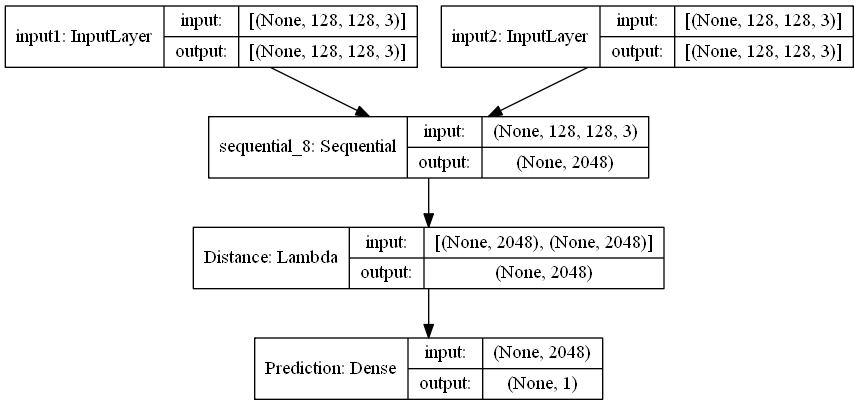

In [138]:
siamese_model = get_siamese_model((128,128,3))
plot_model(siamese_model, show_shapes=True, show_layer_names=True)

In [139]:
optimizer = Adam(learning_rate=0.01)
siamese_model.compile(loss='binary_crossentropy', optimizer=optimizer)
siamese_model.summary()

Model: "model_8"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input1 (InputLayer)             [(None, 128, 128, 3) 0                                            
__________________________________________________________________________________________________
input2 (InputLayer)             [(None, 128, 128, 3) 0                                            
__________________________________________________________________________________________________
sequential_8 (Sequential)       (None, 2048)         25057832    input1[0][0]                     
                                                                 input2[0][0]                     
__________________________________________________________________________________________________
Distance (Lambda)               (None, 2048)         0           sequential_8[0][0]         

In [79]:
img1=inter_train["img1"].values.tolist()
id1=inter_train["id1"].values.tolist()

In [140]:
#train data
intra_train_siamese=[]
inter_train_siamese=[]
for index, row in intra_train.iterrows():
    intra_train_siamese.append(((str(row["id1"]), row["img1"]), (str(row["id2"]), row["img2"]), 1))
for index, row in inter_train.iterrows():
    inter_train_siamese.append(((str(row["id1"]), row["img1"]), (str(row["id2"]), row["img2"]), 0))
train_siamese=intra_train_siamese+inter_train_siamese
## test data
intra_test_siamese=[]
inter_test_siamese=[]
for index, row in intra_test.iterrows():
    intra_test_siamese.append(((str(row["id1"]), row["img1"]), (str(row["id2"]), row["img2"]), 1))
for index, row in inter_test.iterrows():
    inter_test_siamese.append(((str(row["id1"]), row["img1"]), (str(row["id2"]), row["img2"]), 0))
test_siamese=intra_test_siamese+inter_test_siamese

In [141]:
#print(train_siamese)
len(train_siamese), len(test_siamese)

(5556, 2232)

In [142]:
#train_siamese
import random 
import copy
random.shuffle(train_siamese) 
random.shuffle(test_siamese) 

In [143]:
epochs = 10
batch_size = 70

acc_list   = []
train_loss = []

for epoch in range(1, epochs+1):
    print(f"\n\n-------------------------------  START OF EPOCH - {epoch}  -------------------------------")
    
    t = time.time()
    bt = time.time()
    i = 1
    loss = []
    
    # Training on Train data
    for batch_x, batch_y in get_batch(train_siamese, batch_size=batch_size):
        loss.append(siamese_model.train_on_batch(batch_x, batch_y))
        if i%10==0:
            print(f"Batch {i} \t| Done in {(time.time()-bt):.2f} secs \t| Loss = {sum(loss)/len(loss)}")
            train_loss.append(sum(loss)/len(loss))
            bt = time.time()
            loss = []
        i+=1
        #print("i : "+str(i))
    # Testing on Test data
    y_true = None
    y_pred = None
    for batch_x, batch_y in get_batch(test_siamese, batch_size=batch_size):
        y_pred_now = siamese_model.predict(x=batch_x)
        if y_true is None:
            y_true = batch_y
            y_pred = y_pred_now
        else:
            y_true = np.vstack([y_true, batch_y])
            y_pred = np.vstack([y_pred, y_pred_now])
    y_pred = np.where(y_pred>=0.5,1,0)
    accuracy = accuracy_score(y_true, y_pred)
    acc_list.append(accuracy)
    
    # Saving the model if accuracy is better than previous ones.
    if accuracy>=max(acc_list):
        siamese_model.save(f"Model1-epoch-{epoch}")
    
    print(f'Epoch took {(time.time()-t):.2f} secs')
    print(f'Accuracy on test = {accuracy}')
    print("\nConfusion Matrix:\n", confusion_matrix(y_true, y_pred))
    print("\nClassification Report:\n", classification_report(y_true, y_pred))
        



-------------------------------  START OF EPOCH - 1  -------------------------------
Batch 10 	| Done in 79.08 secs 	| Loss = 0.8613788962364197
Batch 20 	| Done in 78.90 secs 	| Loss = 0.6797506034374237
Batch 30 	| Done in 77.71 secs 	| Loss = 0.661037003993988
Batch 40 	| Done in 70.82 secs 	| Loss = 0.6589286804199219
Batch 50 	| Done in 75.11 secs 	| Loss = 0.617213636636734
Batch 60 	| Done in 75.04 secs 	| Loss = 0.5967756807804108
Batch 70 	| Done in 72.53 secs 	| Loss = 0.6148975372314454
Batch 80 	| Done in 79.79 secs 	| Loss = 0.5857959866523743
INFO:tensorflow:Assets written to: Model1-epoch-1\assets


INFO:tensorflow:Assets written to: Model1-epoch-1\assets
C:\Users\Bolbol\anaconda3\lib\site-packages\keras\utils\generic_utils.py:494: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  warnings.warn('Custom mask layers require a config and must override '


Epoch took 843.95 secs
Accuracy on test = 0.6487455197132617

Confusion Matrix:
 [[683 433]
 [351 765]]

Classification Report:
               precision    recall  f1-score   support

           0       0.66      0.61      0.64      1116
           1       0.64      0.69      0.66      1116

    accuracy                           0.65      2232
   macro avg       0.65      0.65      0.65      2232
weighted avg       0.65      0.65      0.65      2232



-------------------------------  START OF EPOCH - 2  -------------------------------
Batch 10 	| Done in 53.56 secs 	| Loss = 0.5874056339263916
Batch 20 	| Done in 55.27 secs 	| Loss = 0.5537035256624222
Batch 30 	| Done in 53.66 secs 	| Loss = 0.5590823411941528
Batch 40 	| Done in 54.73 secs 	| Loss = 0.5554916173219681
Batch 50 	| Done in 54.69 secs 	| Loss = 0.5399753451347351
Batch 60 	| Done in 54.55 secs 	| Loss = 0.49102782011032103
Batch 70 	| Done in 57.57 secs 	| Loss = 0.48965486884117126
Batch 80 	| Done in 52.41 secs 	| L

In [144]:
def plot_metrics(loss, acc):
    plt.figure(figsize=(15,5))
    plt.subplot(121)
    plt.plot(loss[1:], 'b', label='Loss')
    plt.legend()
    plt.subplot(122)
    plt.plot(acc[1:], 'r', label='Accuracy')
    plt.legend()
    plt.show()

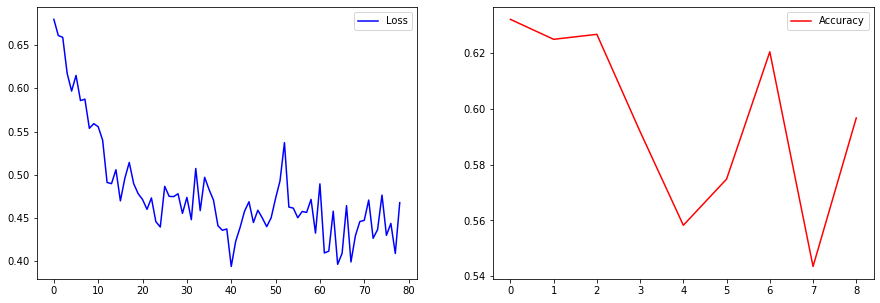

In [145]:
plot_metrics(train_loss, acc_list)

### Le meilleur accuracy score = 0.65

### Pour ameliorer les resultats j'ai teste plusieurs repartitions pour les listes de comparaisons ainsi on tient ce resultat:

In [146]:
def create_pairs():
    num_folders = len(os.listdir(ROOT))
    similar_data = []
    dissimilar_data = []

    for i in range(num_folders-1):
        files = os.listdir(os.path.join(ROOT, str(i)))
        
        # Creating pairs of similar faces
        for pair in list(combinations(files, 2)):
            similar_data.append(((str(i), pair[0]), (str(i), pair[1]), 1))

        # Creating pairs of different faces
        for j in range(i, min(i+40, num_folders)):
            dissimilar_data.append(((str(i), "0.jpg"), (str(j), "0.jpg"), 0))
        
    return similar_data+dissimilar_data

In [147]:
ROOT=flw
train_pairs, test_pairs = train_test_split(create_pairs(), test_size=0.05, random_state=5)
len(train_pairs), len(test_pairs)

(113351, 5966)

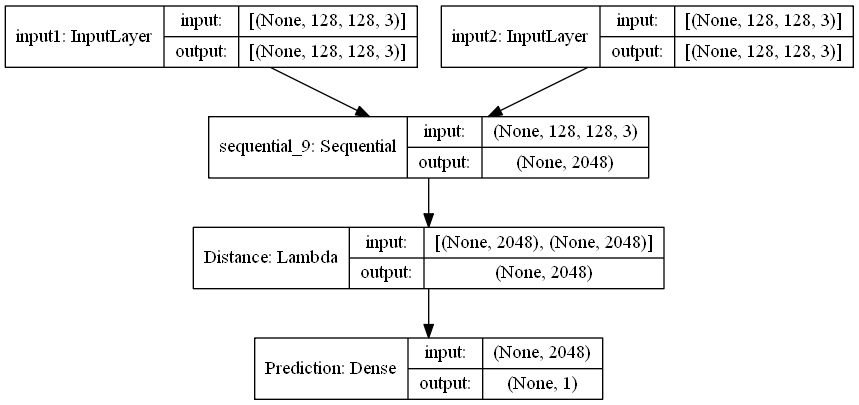

In [148]:
siamese_model = get_siamese_model((128,128,3))
plot_model(siamese_model, show_shapes=True, show_layer_names=True)

In [149]:
optimizer = Adam(learning_rate=0.01)
siamese_model.compile(loss='binary_crossentropy', optimizer=optimizer)
siamese_model.summary()

Model: "model_9"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input1 (InputLayer)             [(None, 128, 128, 3) 0                                            
__________________________________________________________________________________________________
input2 (InputLayer)             [(None, 128, 128, 3) 0                                            
__________________________________________________________________________________________________
sequential_9 (Sequential)       (None, 2048)         25057832    input1[0][0]                     
                                                                 input2[0][0]                     
__________________________________________________________________________________________________
Distance (Lambda)               (None, 2048)         0           sequential_9[0][0]         

In [150]:
epochs = 10
batch_size = 1024

acc_list   = []
train_loss = []


for epoch in range(1, epochs+1):
    print(f"\n\n-------------------------------  START OF EPOCH - {epoch}  -------------------------------")
    
    t = time.time()
    bt = time.time()
    i = 1
    loss = []
    
    # Training on Train data
    for batch_x, batch_y in get_batch(train_pairs, batch_size=batch_size):
        loss.append(siamese_model.train_on_batch(batch_x, batch_y))
        if i%10==0:
            print(f"Batch {i} \t| Done in {(time.time()-bt):.2f} secs \t| Loss = {sum(loss)/len(loss)}")
            train_loss.append(sum(loss)/len(loss))
            bt = time.time()
            loss = []
        i+=1
        
    # Testing on Test data
    y_true = None
    y_pred = None
    for batch_x, batch_y in get_batch(test_pairs, batch_size=batch_size):
        y_pred_now = siamese_model.predict(x=batch_x)
        if y_true is None:
            y_true = batch_y
            y_pred = y_pred_now
        else:
            y_true = np.vstack([y_true, batch_y])
            y_pred = np.vstack([y_pred, y_pred_now])
    y_pred = np.where(y_pred>=0.5,1,0)
    accuracy = accuracy_score(y_true, y_pred)
    acc_list.append(accuracy)
    
    # Saving the model if accuracy is better than previous ones.
    if accuracy>=max(acc_list):
        siamese_model.save(f"Model2-epoch-{epoch}")
    
    print(f'Epoch took {(time.time()-t):.2f} secs')
    print(f'Accuracy on test = {accuracy}')
    print("\nConfusion Matrix:\n", confusion_matrix(y_true, y_pred))
    print("\nClassification Report:\n", classification_report(y_true, y_pred))
        



-------------------------------  START OF EPOCH - 1  -------------------------------
Batch 10 	| Done in 591.96 secs 	| Loss = 0.6899478197097778
Batch 20 	| Done in 662.36 secs 	| Loss = 0.5601109206676483
Batch 30 	| Done in 522.58 secs 	| Loss = 0.5261182427406311
Batch 40 	| Done in 629.62 secs 	| Loss = 0.4970118343830109
Batch 50 	| Done in 636.10 secs 	| Loss = 0.464740589261055
Batch 60 	| Done in 635.87 secs 	| Loss = 0.42223140001297
Batch 70 	| Done in 630.16 secs 	| Loss = 0.38238175213336945
Batch 80 	| Done in 637.26 secs 	| Loss = 0.3383696496486664
Batch 90 	| Done in 626.69 secs 	| Loss = 0.30750181078910827
Batch 100 	| Done in 625.49 secs 	| Loss = 0.2868713766336441
Batch 110 	| Done in 631.39 secs 	| Loss = 0.2600346654653549
INFO:tensorflow:Assets written to: Model2-epoch-1\assets


INFO:tensorflow:Assets written to: Model2-epoch-1\assets
C:\Users\Bolbol\anaconda3\lib\site-packages\keras\utils\generic_utils.py:494: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  warnings.warn('Custom mask layers require a config and must override '


Epoch took 7298.56 secs
Accuracy on test = 0.8305397251089507

Confusion Matrix:
 [[2709  591]
 [ 420 2246]]

Classification Report:
               precision    recall  f1-score   support

           0       0.87      0.82      0.84      3300
           1       0.79      0.84      0.82      2666

    accuracy                           0.83      5966
   macro avg       0.83      0.83      0.83      5966
weighted avg       0.83      0.83      0.83      5966



-------------------------------  START OF EPOCH - 2  -------------------------------
Batch 10 	| Done in 761.85 secs 	| Loss = 0.22779581397771836
Batch 20 	| Done in 610.27 secs 	| Loss = 0.20327826142311095
Batch 30 	| Done in 616.57 secs 	| Loss = 0.19325843155384065
Batch 40 	| Done in 616.81 secs 	| Loss = 0.18042704463005066
Batch 50 	| Done in 616.15 secs 	| Loss = 0.16287261694669725
Batch 60 	| Done in 618.16 secs 	| Loss = 0.13821165263652802
Batch 70 	| Done in 621.16 secs 	| Loss = 0.13062672838568687
Batch 80 	| Done i

INFO:tensorflow:Assets written to: Model2-epoch-2\assets
C:\Users\Bolbol\anaconda3\lib\site-packages\keras\utils\generic_utils.py:494: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  warnings.warn('Custom mask layers require a config and must override '


Epoch took 7689.09 secs
Accuracy on test = 0.8677505866577271

Confusion Matrix:
 [[2999  301]
 [ 488 2178]]

Classification Report:
               precision    recall  f1-score   support

           0       0.86      0.91      0.88      3300
           1       0.88      0.82      0.85      2666

    accuracy                           0.87      5966
   macro avg       0.87      0.86      0.87      5966
weighted avg       0.87      0.87      0.87      5966



-------------------------------  START OF EPOCH - 3  -------------------------------
Batch 10 	| Done in 796.63 secs 	| Loss = 0.12214142382144928
Batch 20 	| Done in 876.18 secs 	| Loss = 0.1063839167356491
Batch 30 	| Done in 802.02 secs 	| Loss = 0.09980536252260208
Batch 40 	| Done in 656.27 secs 	| Loss = 0.09160558357834817
Batch 50 	| Done in 579.88 secs 	| Loss = 0.09284738302230836
Batch 60 	| Done in 580.30 secs 	| Loss = 0.08466946706175804
Batch 70 	| Done in 580.85 secs 	| Loss = 0.0872371256351471
Batch 80 	| Done in 

INFO:tensorflow:Assets written to: Model2-epoch-3\assets
C:\Users\Bolbol\anaconda3\lib\site-packages\keras\utils\generic_utils.py:494: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  warnings.warn('Custom mask layers require a config and must override '


Epoch took 7940.51 secs
Accuracy on test = 0.9465303385853168

Confusion Matrix:
 [[3084  216]
 [ 103 2563]]

Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.93      0.95      3300
           1       0.92      0.96      0.94      2666

    accuracy                           0.95      5966
   macro avg       0.94      0.95      0.95      5966
weighted avg       0.95      0.95      0.95      5966



-------------------------------  START OF EPOCH - 4  -------------------------------
Batch 10 	| Done in 710.83 secs 	| Loss = 0.06988992504775524
Batch 20 	| Done in 709.70 secs 	| Loss = 0.08364094868302345
Batch 30 	| Done in 735.41 secs 	| Loss = 0.08134107366204262
Batch 40 	| Done in 741.53 secs 	| Loss = 0.07316897995769978
Batch 50 	| Done in 715.85 secs 	| Loss = 0.07019882537424564
Batch 60 	| Done in 669.58 secs 	| Loss = 0.06261369287967682
Batch 70 	| Done in 832.35 secs 	| Loss = 0.05637643076479435
Batch 80 	| Done i

INFO:tensorflow:Assets written to: Model2-epoch-5\assets
C:\Users\Bolbol\anaconda3\lib\site-packages\keras\utils\generic_utils.py:494: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  warnings.warn('Custom mask layers require a config and must override '


Epoch took 8716.44 secs
Accuracy on test = 0.9493798189741871

Confusion Matrix:
 [[3079  221]
 [  81 2585]]

Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.93      0.95      3300
           1       0.92      0.97      0.94      2666

    accuracy                           0.95      5966
   macro avg       0.95      0.95      0.95      5966
weighted avg       0.95      0.95      0.95      5966



-------------------------------  START OF EPOCH - 6  -------------------------------
Batch 10 	| Done in 580.08 secs 	| Loss = 0.045797794312238696
Batch 20 	| Done in 582.68 secs 	| Loss = 0.04443078637123108
Batch 30 	| Done in 581.50 secs 	| Loss = 0.045066397078335284
Batch 40 	| Done in 582.17 secs 	| Loss = 0.037452080845832826
Batch 50 	| Done in 582.27 secs 	| Loss = 0.04290699698030949
Batch 60 	| Done in 580.55 secs 	| Loss = 0.039339029043912885
Batch 70 	| Done in 583.00 secs 	| Loss = 0.03320385310798883
Batch 80 	| Do

INFO:tensorflow:Assets written to: Model2-epoch-6\assets
C:\Users\Bolbol\anaconda3\lib\site-packages\keras\utils\generic_utils.py:494: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  warnings.warn('Custom mask layers require a config and must override '


Epoch took 6775.38 secs
Accuracy on test = 0.9728461280590011

Confusion Matrix:
 [[3272   28]
 [ 134 2532]]

Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.99      0.98      3300
           1       0.99      0.95      0.97      2666

    accuracy                           0.97      5966
   macro avg       0.97      0.97      0.97      5966
weighted avg       0.97      0.97      0.97      5966



-------------------------------  START OF EPOCH - 7  -------------------------------
Batch 10 	| Done in 668.47 secs 	| Loss = 0.04394267797470093
Batch 20 	| Done in 667.65 secs 	| Loss = 0.043721345439553264
Batch 30 	| Done in 671.34 secs 	| Loss = 0.04540275484323501
Batch 40 	| Done in 667.97 secs 	| Loss = 0.04203268624842167
Batch 50 	| Done in 667.47 secs 	| Loss = 0.04141100123524666
Batch 60 	| Done in 670.00 secs 	| Loss = 0.03630981370806694
Batch 70 	| Done in 669.61 secs 	| Loss = 0.033194221928715704
Batch 80 	| Done

INFO:tensorflow:Assets written to: Model2-epoch-10\assets
C:\Users\Bolbol\anaconda3\lib\site-packages\keras\utils\generic_utils.py:494: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  warnings.warn('Custom mask layers require a config and must override '


Epoch took 8993.75 secs
Accuracy on test = 0.9810593362386859

Confusion Matrix:
 [[3257   43]
 [  70 2596]]

Classification Report:
               precision    recall  f1-score   support

           0       0.98      0.99      0.98      3300
           1       0.98      0.97      0.98      2666

    accuracy                           0.98      5966
   macro avg       0.98      0.98      0.98      5966
weighted avg       0.98      0.98      0.98      5966



In [151]:
def plot_metrics(loss, acc):
    plt.figure(figsize=(15,5))
    plt.subplot(121)
    plt.plot(loss[1:], 'b', label='Loss')
    plt.legend()
    plt.subplot(122)
    plt.plot(acc[1:], 'r', label='Accuracy')
    plt.legend()
    plt.show()

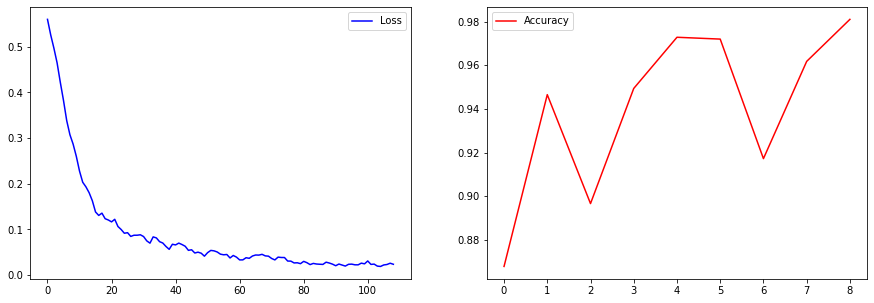

In [152]:
plot_metrics(train_loss, acc_list)

## Afin de varier nos travaux, on essaie de realiser un modele facenet sans les listes de comparaisons precedentes :

### Facenet 

#### Definition des fonctions d'aide pour traitement des donnees:

In [182]:
import os 
import glob 

from PIL import Image, ImageDraw


def get_files(path='./', ext=('.png', '.jpeg', '.jpg')):
    """ Get all image files """
    files = []
    for e in ext:
        files.extend(glob.glob(f'{path}/**/*{e}'))
    files.sort(key=lambda p: (os.path.dirname(p), int(os.path.basename(p).split('.')[0])))
    return files

def to_rgb_and_save(path):
    """ Some of the images may have RGBA mode """
    for p in path:
        img = Image.open(p)
        if img.mode != 'RGB':
            img = img.convert('RGB') 
            img.save(p)

#### Definition des chemins des images

In [183]:
ABS_PATH = r'C:\Users\Bolbol\Desktop\stage\lfw'
 
TRAIN_DIR = os.path.join(ABS_PATH, 'Face Dataset Train')
TEST_DIR = os.path.join(ABS_PATH, 'Face Dataset Test')

TRAIN_DIR_SAMPLE = os.path.join(ABS_PATH, 'Face Dataset Train Sample')
TEST_DIR_SAMPLE = os.path.join(ABS_PATH, 'Face Dataset Test Sample')

ALIGNED_TRAIN_DIR = TRAIN_DIR + '_cropped'
ALIGNED_TEST_DIR = TEST_DIR + '_cropped'

In [184]:
#Puisqu'on a un grand nombre d'image dan train et test alors on prend un echantillon pour la visualisation dans des futurs etapes
i = 0
for directory in os.listdir(TRAIN_DIR):
    if i < 30 :
        path_src=os.path.join(TRAIN_DIR, directory)
        path_dest=os.path.join(TRAIN_DIR_SAMPLE, directory)
        destination = shutil.copytree(path_src, path_dest) 
        i = i+1
i = 0
for directory in os.listdir(TEST_DIR):
    if i < 30 :
        path_src=os.path.join(TEST_DIR, directory)
        path_dest=os.path.join(TEST_DIR_SAMPLE, directory)
        destination = shutil.copytree(path_src, path_dest) 
        i = i+1


FileExistsError: [WinError 183] Cannot create a file when that file already exists: 'C:\\Users\\Bolbol\\Desktop\\stage\\lfw\\Face Dataset Train Sample\\0'

#### Preparation des donnees

In [185]:
from collections import Counter 


# 1. Get path for TRAIN_DIR/TEST_DIR
trainF, testF = get_files(TRAIN_DIR), get_files(TEST_DIR)
trainSample, testSample =  get_files(TRAIN_DIR_SAMPLE), get_files(TEST_DIR_SAMPLE)
# prepare info for printing
trainC, testC = Counter(map(os.path.dirname, trainF)), Counter(map(os.path.dirname, testF))
train_total, train_text  = sum(trainC.values()), '\n'.join([f'\t- {os.path.basename(fp)} - {c}' for fp, c in trainC.items()])
test_total, test_text  = sum(testC.values()), '\n'.join([f'\t- {os.path.basename(fp)} - {c}' for fp, c in testC.items()])

print(f'Train files\n\tpath: {TRAIN_DIR}\n\ttotal number: {train_total}\n{train_text}')
print(f'Train files\n\tpath: {TEST_DIR}\n\ttotal number: {test_total}\n{test_text}')

Train files
	path: C:\Users\Bolbol\Desktop\stage\lfw\Face Dataset Train
	total number: 2636
	- 0 - 4
	- 1 - 2
	- 10 - 4
	- 100 - 2
	- 1000 - 2
	- 1001 - 3
	- 1002 - 5
	- 1004 - 2
	- 1005 - 2
	- 1008 - 3
	- 1009 - 2
	- 101 - 2
	- 1010 - 2
	- 1011 - 3
	- 1014 - 5
	- 1015 - 3
	- 1017 - 2
	- 1018 - 4
	- 102 - 2
	- 1021 - 3
	- 1022 - 3
	- 1023 - 2
	- 1025 - 5
	- 1026 - 2
	- 1027 - 3
	- 1028 - 2
	- 1029 - 2
	- 103 - 5
	- 1030 - 2
	- 1031 - 2
	- 1032 - 2
	- 1038 - 2
	- 1039 - 3
	- 1040 - 2
	- 1042 - 5
	- 1044 - 3
	- 1045 - 2
	- 1047 - 2
	- 1048 - 2
	- 1049 - 2
	- 1050 - 2
	- 1051 - 4
	- 1053 - 5
	- 1054 - 3
	- 1055 - 5
	- 1056 - 2
	- 1058 - 2
	- 1059 - 2
	- 106 - 4
	- 1060 - 5
	- 1063 - 3
	- 1064 - 3
	- 1065 - 2
	- 1066 - 3
	- 1068 - 3
	- 1069 - 3
	- 107 - 2
	- 1070 - 2
	- 1073 - 3
	- 1076 - 4
	- 1077 - 3
	- 1079 - 2
	- 108 - 2
	- 1080 - 2
	- 1081 - 3
	- 1084 - 3
	- 1085 - 2
	- 1086 - 2
	- 1087 - 2
	- 1089 - 2
	- 109 - 4
	- 1091 - 3
	- 1093 - 4
	- 1096 - 5
	- 1099 - 4
	- 1100 - 2
	- 1102 - 2


In [186]:
# 2. Convert all img to RGB 
to_rgb_and_save(trainF), to_rgb_and_save(testF)

(None, None)

#### fonctions pour image plotter

In [187]:
from math import ceil 

import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid
%matplotlib inline 

from matplotlib.patches import Ellipse


def imshow(img, ax, title):  
    ax.imshow(img)
    if title:
        el = Ellipse((2, -1), 0.5, 0.5)
        ax.annotate(title, xy=(1, 0), xycoords='axes fraction', ha='right', va='bottom',
                    bbox=dict(boxstyle="round", fc="0.8"), 
                    arrowprops=dict(arrowstyle="simple", fc="0.6", ec="none", 
                                    patchB=el, connectionstyle="arc3, rad=0.3"))
    ax.set_xticks([]), ax.set_yticks([])

def plot_gallery(images, ncols, nrows, titles=None, title='', figsize=None): 
    if figsize is None: 
        figsize = (18, ncols) if ncols < 10 else (18, 20)  
    fig = plt.figure(figsize=figsize)
    grid = ImageGrid(fig, 111, nrows_ncols=(nrows, ncols), axes_pad=0.02)

    for i, ax in enumerate(grid): 
        if i == len(images): break 
        imshow(images[i], ax, titles[i] if titles is not None else '')

    # there are some problems with suptitle alignment 
    y_title_pos = grid[0].get_position().get_points()[1][1] - 0.33 / (1 if nrows == 1 else nrows / 3)
    plt.suptitle(title, y=y_title_pos, fontsize=12)

def plot(paths=None, images=None, titles=None, axtitle=True, title='', to_size=(512, 512)): 
    """
    Plot image gallery by passing (paths, title) or (images, titles)
    :param paths: list of image paths
    :param images: list of (PIL.Image | np.array | torch.Tensor) objects 
    :param titles: list of image titles 
    :param bool axtitle: if paths is not None, then axtitle=True leads to use basedir name as titles 
    :param str title: gallery title   
    :param to_size: image resizing size before plot, default (512, 512)
    """

    if paths is not None and len(paths): 
        images = [Image.open(p).resize(to_size) for p in paths]

        nrows = int(ceil(len(images) / 12)) # 12 images per row 
        ncols = 12 if nrows > 1 else len(images)

        if axtitle: 
              titles = [os.path.split(os.path.split(p)[0])[1] for p in paths]

        plot_gallery(images, ncols, nrows, titles, title)

    elif images is not None and len(images): 
        if isinstance(images, list): 
            images = np.array(images)

        nrows = int(ceil(len(images) / 12)) # 12 images per row 
        ncols = 12 if nrows > 1 else len(images)

        # Rescale to [0., 1.]
        if images[0].max() > 1: 
            images /= 255. 

        # if torch.Tensor change axes 
        if not isinstance(images, np.ndarray): 
            if images.size(1) == 3 or 1: 
                images = images.permute((0, 2, 3, 1))

        plot_gallery(images, ncols, nrows, titles, title)


    else: 
        raise LookupError('You didnt pass any path or image objects')
    plt.show()

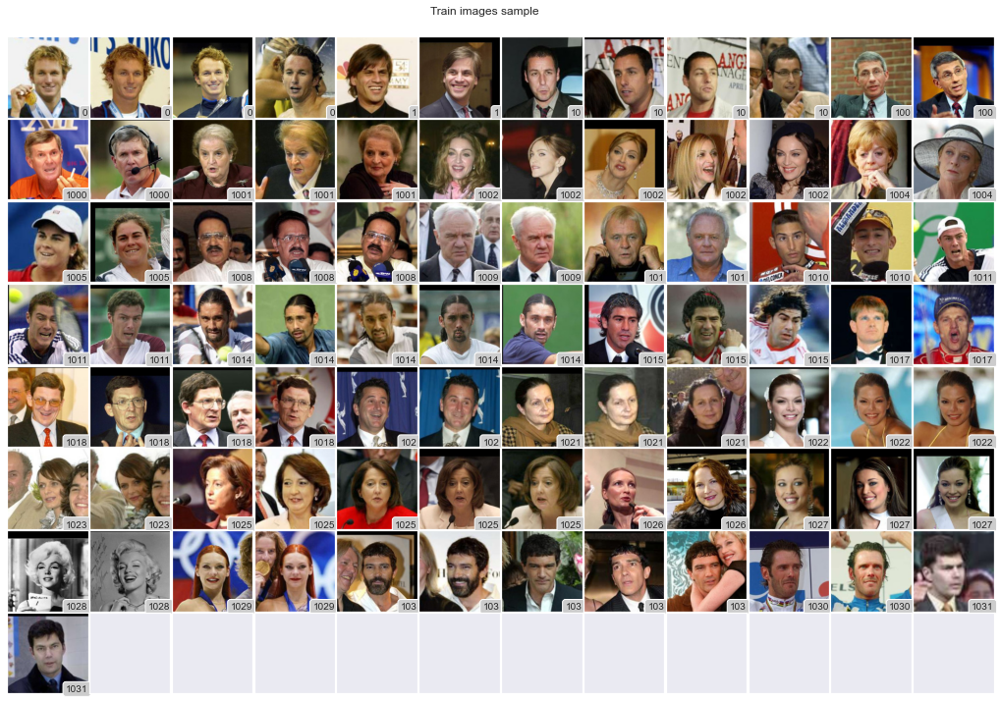

In [188]:
plot(paths=trainSample, title='Train images sample')

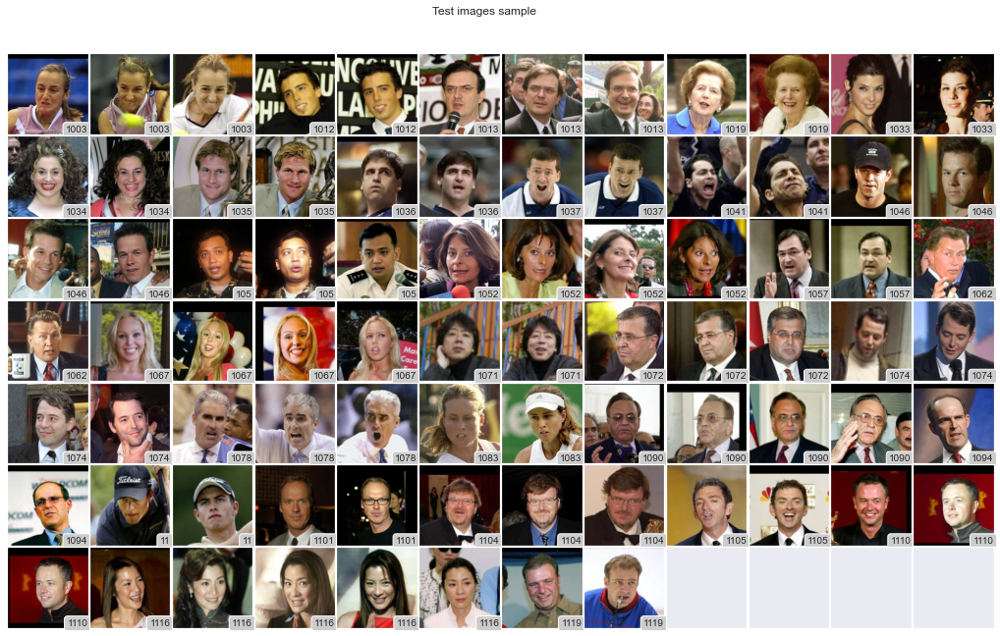

In [189]:
plot(paths=testSample, title='Test images sample')

#### Instalation de facenet_pytorch avec detection par MTCNN et préformé vggface-2 InceptionResnetV1

In [190]:
#!pip install facenet-pytorch  # avtiver la cmd si vous n'avez pad installe facenet avant

from facenet_pytorch import MTCNN, InceptionResnetV1, training, fixed_image_standardization

#### Fonction pour retrancher et sauvegarder les images en se basant sur le detecteur MTCNN

In [191]:
import tqdm 

import torch
from torchvision import datasets, transforms
from torch.utils.data import DataLoader

import numpy as np

import shutil

device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
print(f'Running on device: {device}')


def crop_face_and_save(path, new_path=None, model=MTCNN, transformer=None, params=None):
    """
    Detect face on each image, crop them and save to "new_path"
    :param str path: path with images will be passed to  datasets.ImageFolder
    :param str new_path: path to locate new "aligned" images, if new_path is None 
                     then new_path will be path + "_cropped" 
    :param model: model to detect faces, default MTCNN  
    :param transformer: transformer object will be passed to ImageFolder
    :param params: parameters of MTCNN model   
    """
    if not new_path: 
        new_path = path + '_cropped'

    # in case new_path exists MTCNN model will raise error 
    if os.path.exists(new_path):
        shutil.rmtree(new_path)

    # it is default parameters for MTCNN 
    if not params:
        params = {
            'image_size': 160, 'margin': 0, 
            'min_face_size': 10, 'thresholds': [0.6, 0.7, 0.7],
            'factor': 0.709, 'post_process': False, 'device': device
            }
    
    model = model(**params)

    if not transformer:
        transformer = transforms.Lambda(
            lambd=lambda x: x.resize((1280, 1280)) if (np.array(x) > 2000).all() else x
        )
    # for convenience we will use ImageFolder instead of getting Image objects by file paths  
    dataset = datasets.ImageFolder(path, transform=transformer)
    dataset.samples = [(p, p.replace(path, new_path)) for p, _ in dataset.samples]

    # batch size 1 as long as we havent exact image size and MTCNN will raise an error
    loader = DataLoader(dataset, batch_size=1, collate_fn=training.collate_pil)
    for i, (x, y) in enumerate(tqdm.tqdm(loader)): 
        model(x, save_path=y)

    # spare some memory 
    del model, loader, dataset 

Running on device: cpu


#### Detection/retranchement des visages et sauvgardage des nouveaux images alignees 

In [192]:
# 3. Crop train dataset faces and save aligned images 
print('\t- Train data')
crop_face_and_save(TRAIN_DIR, ALIGNED_TRAIN_DIR)

# check if some imgs were missed by detector and failed to save 
train_files, train_aligned_files = get_files(TRAIN_DIR), get_files(ALIGNED_TRAIN_DIR)
if len(train_files) != len(train_aligned_files): 
    files = set(map(lambda fp: os.path.relpath(fp, start=TRAIN_DIR), train_files))
    aligned_files = set(map(lambda fp: os.path.relpath(fp, start=ALIGNED_TRAIN_DIR), train_aligned_files))
    detect_failed_train_files = list(files - aligned_files)
    print(f"\nfiles {len(aligned_files)}/{len(files)}: {', '.join(detect_failed_train_files)} were not saved")

# -------------                     -------------

# Crop test dataset faces and save aligned images 
print('\t- Test data')
crop_face_and_save(TEST_DIR, ALIGNED_TEST_DIR)

# check if some imgs were missed by detector and failed to save 
test_files, test_aligned_files = get_files(TEST_DIR), get_files(ALIGNED_TEST_DIR)
if len(test_files) != len(test_aligned_files): 
    files = set(map(lambda fp: os.path.relpath(fp, start=TEST_DIR), test_files))
    aligned_files = set(map(lambda fp: os.path.relpath(fp, start=ALIGNED_TEST_DIR), test_aligned_files))
    detect_failed_test_files = list(files - aligned_files)
    print(f"\nfiles {len(aligned_files)}/{len(files)}: {', '.join(detect_failed_train_files)} were not saved")

	- Train data


100%|██████████| 2636/2636 [06:01<00:00,  7.29it/s]


	- Test data


100%|██████████| 1103/1103 [02:38<00:00,  6.98it/s]


In [193]:
ALIGNED_TRAIN_DIR_SAMPLE = os.path.join(ABS_PATH, 'Face Dataset Train_cropped Sample')
ALIGNED_TEST_DIR_SAMPLE = os.path.join(ABS_PATH, 'Face Dataset Test_cropped Sample')

In [194]:
#Puisqu'on a un grand nombre d'image dan train et test alors on prend un echantillon pour la visualisation dans des futurs etapes
i = 0
for directory in os.listdir(ALIGNED_TRAIN_DIR):
    if i < 30 :
        path_src=os.path.join(ALIGNED_TRAIN_DIR, directory)
        path_dest=os.path.join(ALIGNED_TRAIN_DIR_SAMPLE, directory)
        destination = shutil.copytree(path_src, path_dest) 
        i = i+1
i = 0
for directory in os.listdir(ALIGNED_TEST_DIR):
    if i < 30 :
        path_src=os.path.join(ALIGNED_TEST_DIR, directory)
        path_dest=os.path.join(ALIGNED_TEST_DIR_SAMPLE, directory)
        destination = shutil.copytree(path_src, path_dest) 
        i = i+1


FileExistsError: [WinError 183] Cannot create a file when that file already exists: 'C:\\Users\\Bolbol\\Desktop\\stage\\lfw\\Face Dataset Train_cropped Sample\\0'

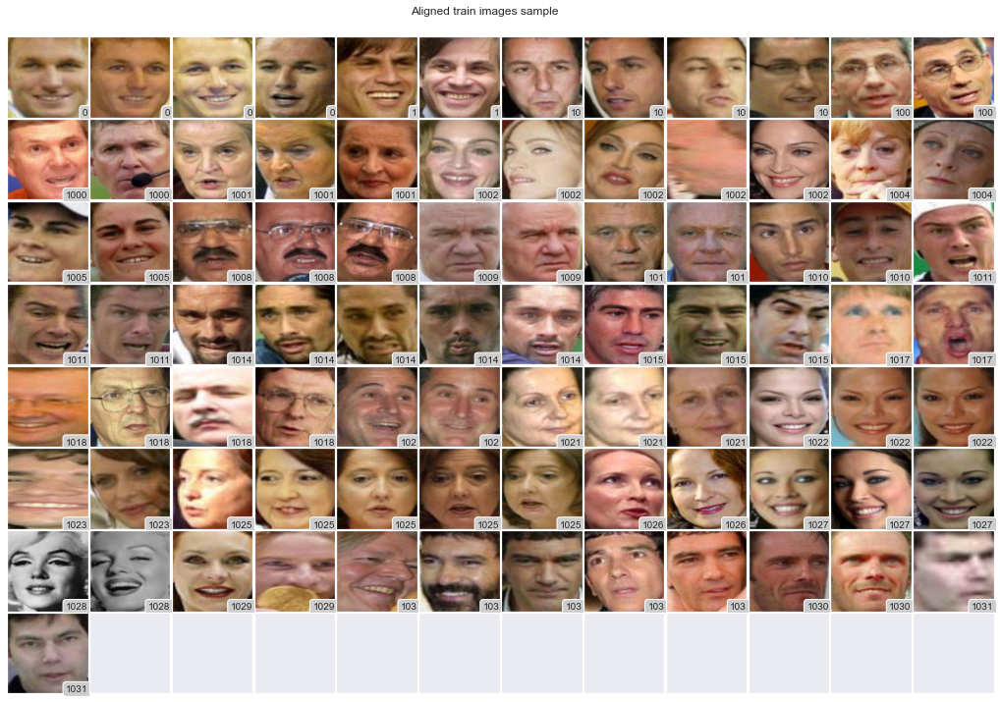

In [195]:
trainF = get_files(ALIGNED_TRAIN_DIR)
trainSample = get_files(ALIGNED_TRAIN_DIR_SAMPLE)
plot(paths=trainSample, title='Aligned train images sample')

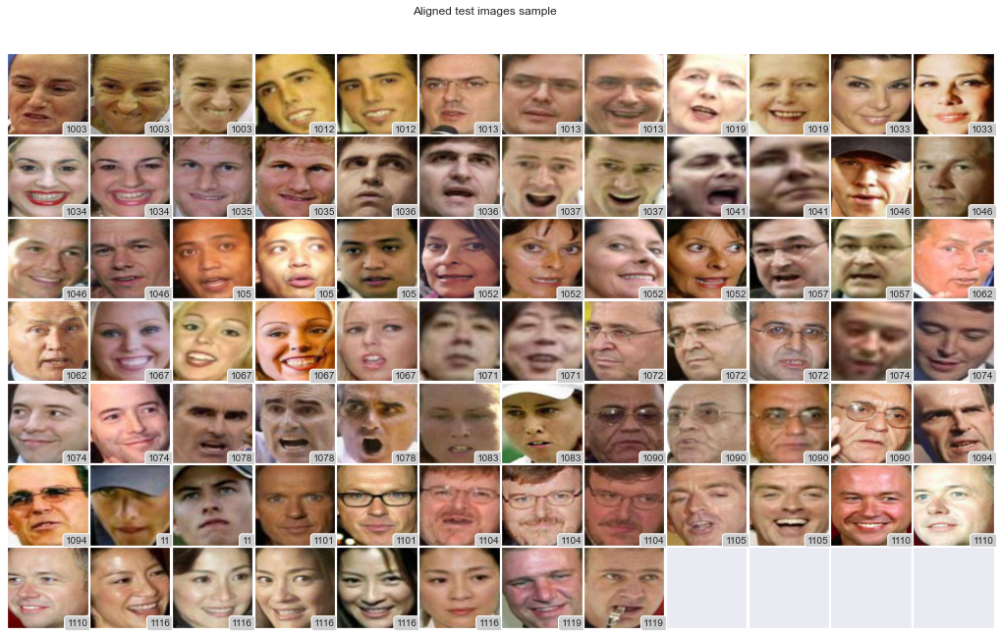

In [196]:
testF = get_files(ALIGNED_TEST_DIR)
testSample = get_files(ALIGNED_TEST_DIR_SAMPLE)
plot(paths=testSample, title='Aligned test images sample')

In [197]:
# Plot failed to aligned train images
trainFailF = list(map(lambda fp: os.path.join(TRAIN_DIR, fp), detect_failed_train_files))
plot(paths=trainFailF)

NameError: name 'detect_failed_train_files' is not defined

#### Ainsi, on conlcut que toutes les images on ete alignees avec succees:

#### Installation de albumentations pour l'augmentation :

In [198]:
#!pip install albumentations # activer la cmd pour installer

import albumentations as A

#### Transformeur des donnees

In [199]:
from facenet_pytorch import fixed_image_standardization

standard_transform = transforms.Compose([
                                np.float32, 
                                transforms.ToTensor(),
                                fixed_image_standardization
])

aug_mask = A.Compose([
                   A.HorizontalFlip(p=0.5),
                   A.VerticalFlip(p=0.15),
                   A.RandomContrast(limit=0.5, p=0.4),
                   A.Rotate(30, p=0.2),
                   A.RandomSizedCrop((120, 120), 160, 160, p=0.4),
                   A.OneOrOther(A.JpegCompression(p=0.2), A.Blur(p=0.2), p=0.66),
                   A.OneOf([
                            A.Rotate(45, p=0.3),
                            A.ElasticTransform(sigma=20, alpha_affine=20, border_mode=0, p=0.2)
                            ], p=0.5),
                  A.HueSaturationValue(val_shift_limit=10, p=0.3)
], p=1)

transform = {
    'train': transforms.Compose([
                                transforms.Lambda(lambda x: aug_mask(image=np.array(x))['image']),
                                 standard_transform
    ]),
    'test': standard_transform
}

C:\Users\Bolbol\anaconda3\lib\site-packages\albumentations\augmentations\transforms.py:1770: FutureWarning: This class has been deprecated. Please use RandomBrightnessContrast
  warnings.warn(
C:\Users\Bolbol\anaconda3\lib\site-packages\albumentations\augmentations\transforms.py:913: FutureWarning: This class has been deprecated. Please use ImageCompression
  warnings.warn(


#### DataLoader pour train/test

In [200]:
from torch.utils.data import SubsetRandomSampler
import pickle
import dill
b = 32

# Original train images 
trainD = datasets.ImageFolder(ALIGNED_TRAIN_DIR, transform=standard_transform)
# Augmented train images 
trainD_aug = datasets.ImageFolder(ALIGNED_TRAIN_DIR, transform=transform['train'])
# Train Loader
trainL = DataLoader(trainD, batch_size=b, num_workers=2) #x: torch.Size([b, 3, 160, 160]),y: torch.Size([b])
trainL_aug = DataLoader(trainD_aug, batch_size=b, num_workers=2)

# Original test images 
testD = datasets.ImageFolder(ALIGNED_TEST_DIR, transform=standard_transform)
# Test Loader
testL = DataLoader(testD, batch_size=b, num_workers=2)

# Convert encoded labels to named claasses
IDX_TO_CLASS = np.array(list(trainD.class_to_idx.keys()))
CLASS_TO_IDX = dict(trainD.class_to_idx.items())



#### Preparation du modele

In [202]:
from facenet_pytorch import InceptionResnetV1
import dill 
import pickle
model = InceptionResnetV1(pretrained='vggface2', dropout_prob=0.5, device=device).eval()

#### Fonction pour l'extraxtion des embeddings :

In [203]:
def fixed_denormalize(image): 
    """ Restandartize images to [0, 255]"""
    return image * 128 + 127.5

def getEmbeds(model, n, loader, imshow=False, n_img=5):
    model.eval()
    # images to display 
    images = []
    embeds, labels = [], []
    for n_i in tqdm.trange(n): 
        for i, (x, y) in enumerate(loader, 1): 
            # on each first batch get 'n_img' images  
            if imshow and i == 1: 
                inds = np.random.choice(x.size(0), min(x.size(0), n_img))
                images.append(fixed_denormalize(x[inds].data.cpu()).permute((0, 2, 3, 1)).numpy())

            embed = model(x.to(device))
            embed = embed.data.cpu().numpy()
            embeds.append(embed), labels.extend(y.data.cpu().numpy())
    if imshow: 
        plot(images=np.concatenate(images))

    return np.concatenate(embeds), np.array(labels)


#### Extraction des embeddings

In [205]:
# 3. Get embeddings 
# Train embeddings 
trainEmbeds, trainLabels = getEmbeds(model, 1, trainL, False)
#trainEmbeds_aug, trainLabels_aug = getEmbeds(model, 50, trainL_aug, imshow=True, n_img=3)
#trainEmbeds = np.concatenate([trainEmbeds, trainEmbeds_aug])
#trainLabels = np.concatenate([trainLabels, trainLabels_aug])

# Test embeddings 
testEmbeds, testLabels = getEmbeds(model, 1, testL, False)

100%|██████████| 1/1 [01:03<00:00, 63.23s/it]


In [206]:
# 4. Save embeddings 
TRAIN_EMBEDS = os.path.join(ABS_PATH, 'trainEmbeds.npz')
TEST_EMBEDS = os.path.join(ABS_PATH, 'testEmbeds.npz')

np.savez(TRAIN_EMBEDS, x=trainEmbeds, y=trainLabels)
np.savez(TEST_EMBEDS, x=testEmbeds, y=testLabels)

# Load the saved embeddings to use them futher 
trainEmbeds, trainLabels = np.load(TRAIN_EMBEDS, allow_pickle=True).values()
testEmbeds, testLabels = np.load(TEST_EMBEDS, allow_pickle=True).values()

# Get named labels
trainLabels, testLabels = IDX_TO_CLASS[trainLabels], IDX_TO_CLASS[testLabels]

#### Fonction pour calculer les embedding

In [207]:
from sklearn.metrics import pairwise_distances
import pandas as pd
import seaborn as sns 
sns.set()

def getDist(x, metric='euclidean', index=None, columns=None):
    dists = pairwise_distances(x, x, metric=metric)
    return pd.DataFrame(dists, index=index, columns=columns)

def heatmap(x, title='', cmap='Greens', linewidth=1):
    plt.figure(figsize=(17, 12))
    plt.title(title)
    sns.heatmap(x, cmap=cmap, square=True)
    plt.show()

#### Distance matrixe pour chaque embedding d'image 

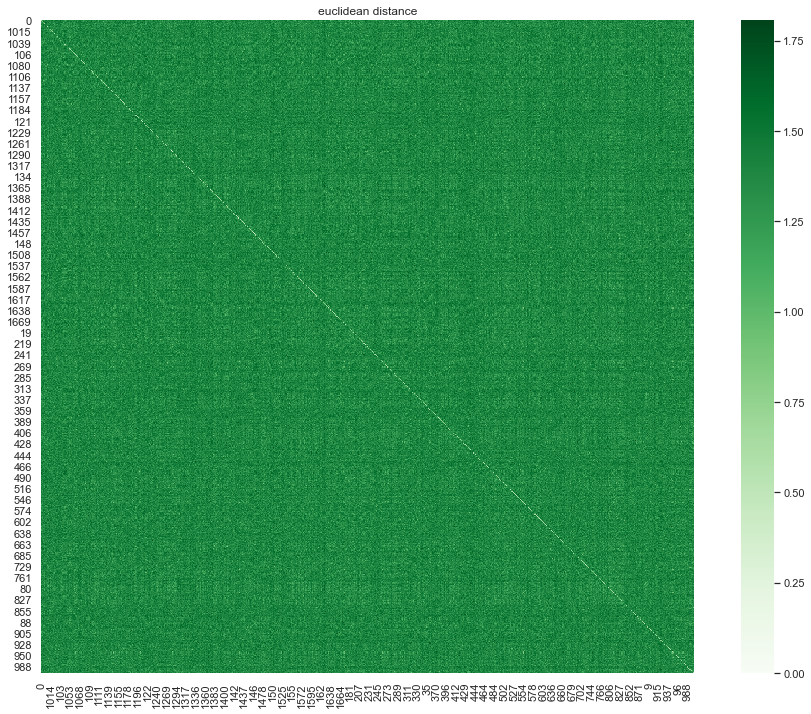

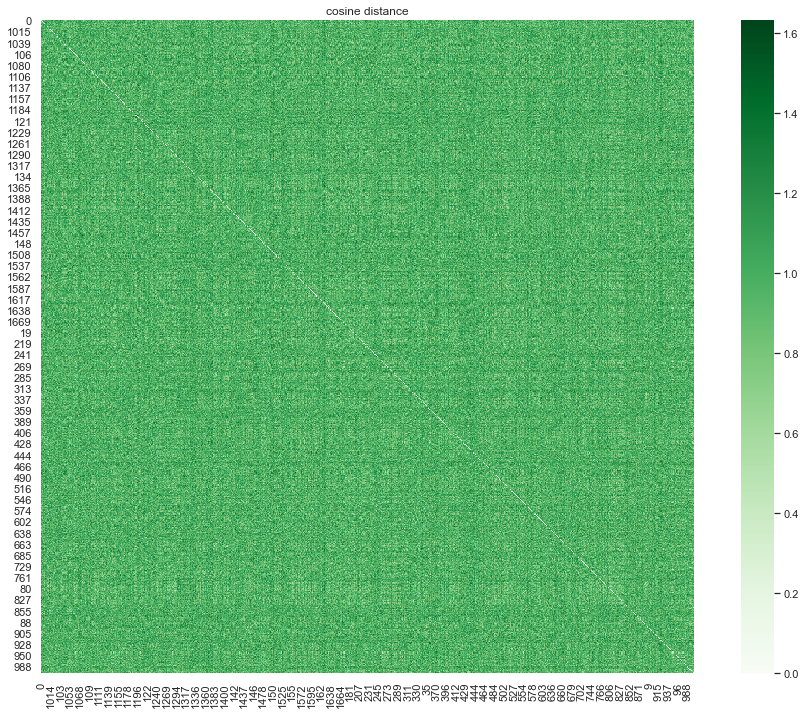

In [208]:
inds = range(2636)

# Train embeddings 
dists = getDist(trainEmbeds[inds], metric='euclidean', index=trainLabels[inds], columns=trainLabels[inds])
heatmap(dists, 'euclidean distance')

dists = getDist(trainEmbeds[inds], metric='cosine', index=trainLabels[inds], columns=trainLabels[inds])
heatmap(dists, 'cosine distance')

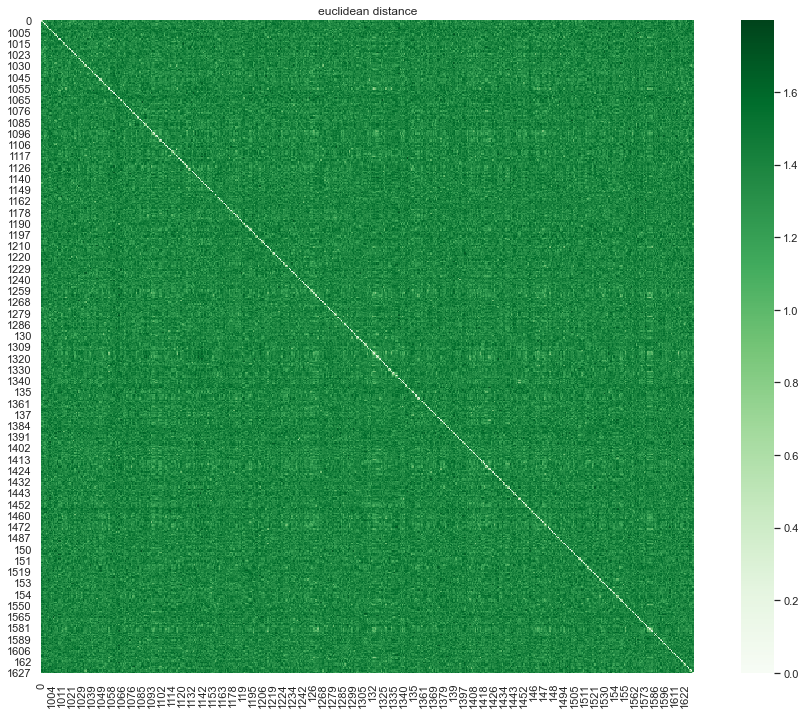

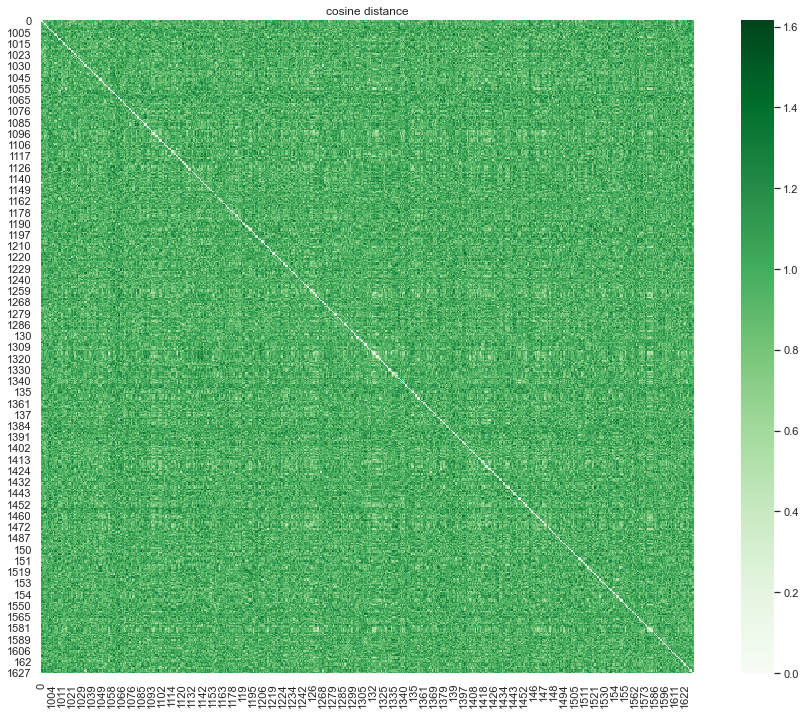

In [209]:
# Test embeddings 
dists = getDist(testEmbeds, metric='euclidean', index=testLabels, columns=testLabels)
heatmap(dists, 'euclidean distance')

dists = getDist(testEmbeds, metric='cosine', index=testLabels, columns=testLabels)
heatmap(dists, 'cosine distance')

#### comment les methodes TSNE et PCA ont groupé(clustered) les images

<ipython-input-210-f15b227fc92a>:19: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.ax.set_yticklabels(np.unique(trainLabels[inds]))


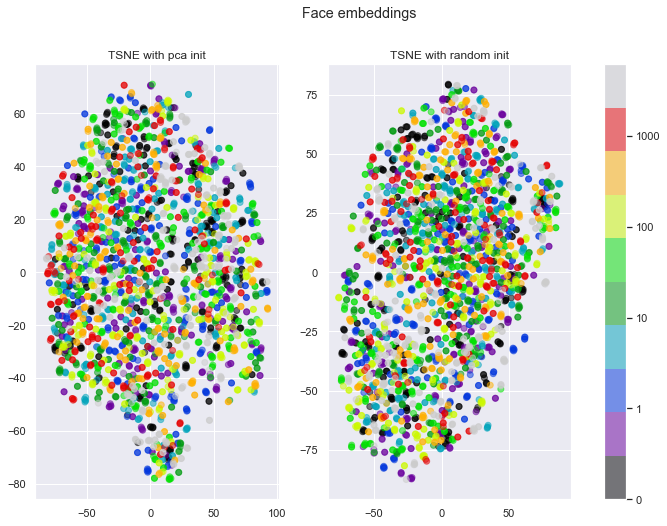

In [210]:
from sklearn.manifold import TSNE


inds = range(2636)
X_tsne1 = TSNE(n_components=2, init='pca', random_state=33).fit_transform(trainEmbeds[inds])
X_tsne2 = TSNE(n_components=2, init='random', random_state=33).fit_transform(trainEmbeds[inds])
y = [CLASS_TO_IDX[label] for label in trainLabels[inds]]

fig, ax = plt.subplots(1, 2, figsize=(12, 8))

img = ax[0].scatter(X_tsne1[:, 0], X_tsne1[:, 1], c=y, alpha=0.5, cmap=plt.cm.get_cmap('nipy_spectral', 10))
ax[1].scatter(X_tsne2[:, 0], X_tsne2[:, 1], c=y, alpha=0.5, cmap=plt.cm.get_cmap('nipy_spectral', 10))

ax[0].set_title('TSNE with pca init')
ax[1].set_title('TSNE with random init')
plt.suptitle('Face embeddings')

cbar = plt.colorbar(img, ax=ax)
cbar.ax.set_yticklabels(np.unique(trainLabels[inds])) 
plt.show()

<ipython-input-246-69145b5b419c>:16: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.ax.set_yticklabels(np.unique(trainLabels[inds]))


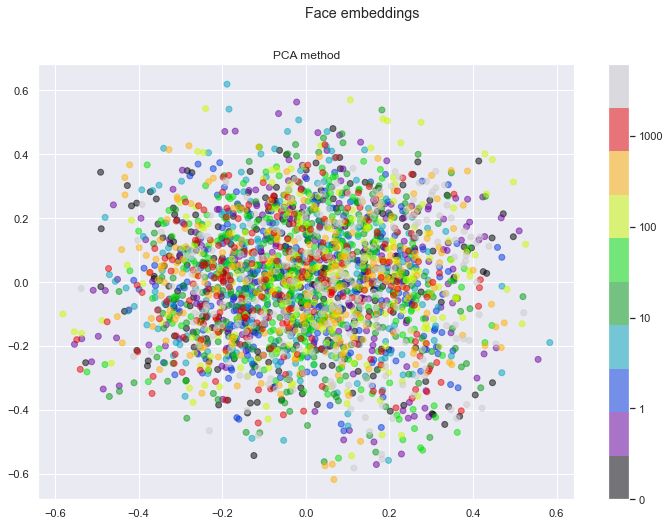

In [246]:
from sklearn.decomposition import PCA
import matplotlib.ticker as mticker

inds = range(2636)
X_pca1 = PCA(n_components=2, random_state=33).fit_transform(trainEmbeds[inds])
y = [CLASS_TO_IDX[label] for label in trainLabels[inds]]

fig, ax = plt.subplots(1, 1, figsize=(12, 8))
img = ax.scatter(X_pca1[:, 0], X_pca1[:, 1], c=y, alpha=0.5, cmap=plt.cm.get_cmap('nipy_spectral', 10))

plt.title('PCA method')
plt.suptitle('Face embeddings')

cbar = plt.colorbar(img, ax=ax)
#cbar.ax.xaxis.set_ticks(np.unique(trainEmbeds[inds]))
cbar.ax.set_yticklabels(np.unique(trainLabels[inds])) 
plt.show()


#### Recherche des parametres optimals pour le classificateur SVC et l'entrainement

In [247]:
# data preparation 
X = np.copy(trainEmbeds)
y = np.array([CLASS_TO_IDX[label] for label in trainLabels])

print(f'X train embeds size: {X.shape}')
print(f'Tagret train size: {y.shape}')

X train embeds size: (2636, 512)
Tagret train size: (2636,)


#### Afin de retrouver les params optimales entre ```'param_grid'``` le processus a prit presaue 4h

In [216]:
%%time 

from sklearn.svm import SVC
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
import warnings

warnings.filterwarnings('ignore', 'Solver terminated early.*')

param_grid = {'C': [1, 10, 100, 1e3, 5e3],
              'gamma': [0.0001, 0.0005, 0.001, 'auto'],
              'kernel': ['rbf', 'sigmoid', 'poly']}
model_params = {'class_weight': 'balanced', 'max_iter': 10, 'probability': True, 'random_state': 3}
model = SVC(**model_params)
clf = GridSearchCV(model, param_grid)
clf.fit(X, y)

print('Best estimator: ', clf.best_estimator_)
print('Best params: ', clf.best_params_)

C:\Users\Bolbol\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:666: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"


Best estimator:  SVC(C=1000.0, class_weight='balanced', gamma=0.0001, max_iter=10,
    probability=True, random_state=3)
Best params:  {'C': 1000.0, 'gamma': 0.0001, 'kernel': 'rbf'}
Wall time: 3h 44min 22s


#### Chargement et entregistrement du modele SVC et ses weights 

In [248]:
import joblib
SVM_PATH = os.path.join(ABS_PATH, 'svm.sav')
joblib.dump(clf, SVM_PATH)
clf = joblib.load(SVM_PATH)

#### Précision des rains et test dataset

In [249]:
# test data preparation 
X_test, y_test = np.copy(testEmbeds), np.array([CLASS_TO_IDX[label] for label in testLabels])
print(f'X train embeds size: {X_test.shape}')
print(f'Tagret train size: {y_test.shape}')

X train embeds size: (1103, 512)
Tagret train size: (1103,)


In [251]:
from sklearn.metrics import accuracy_score

inds = range(2600)
train_acc = accuracy_score(clf.predict(X[inds]), y[inds])
print(f'Accuracy score on train data: {train_acc:.3f}')

test_acc = accuracy_score(clf.predict(X_test), y_test)
print(f'Accuracy score on test data: {test_acc:.3f}')

Accuracy score on train data: 0.611
Accuracy score on test data: 0.000
